In [10]:
import os
import warnings
import hashlib
import shutil
import logging
import random
from collections import defaultdict
from copy import deepcopy
from contextlib import contextmanager
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from PIL import Image, ImageFile
import PIL

import cv2

from sklearn.model_selection import train_test_split, StratifiedShuffleSplit
from sklearn.metrics import ConfusionMatrixDisplay, classification_report, accuracy_score

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torch.optim.lr_scheduler import StepLR, ReduceLROnPlateau, CyclicLR
import torchmetrics
from torchmetrics import Accuracy
from torchinfo import summary

import torchvision
import torchvision.transforms as transforms
import torchvision.transforms.functional as F
import torchvision.models as models
from torchvision.models import ResNet18_Weights
from torchvision.utils import save_image
from torchvision import datasets

import lightning as L
import pytorch_lightning as pl
from pytorch_lightning import LightningModule, Trainer
from pytorch_lightning.loggers import CSVLogger, TensorBoardLogger
from pytorch_lightning.callbacks import EarlyStopping, LearningRateMonitor, ModelCheckpoint
from pytorch_lightning.tuner import Tuner

from my_functions import create_plot

from tqdm import tqdm

# Introduction

> Introduction

Background
Mushroom foraging, while a rewarding activity, comes with significant risks, especially when distinguishing between edible and poisonous species. In the United States alone, approximately 7,500 cases of mushroom poisoning are reported annually. A major contributing factor to these incidents is the misidentification of mushroom species, often due to a lack of knowledge. According to experts, many of these cases could be prevented through better education and awareness. In response to this public health concern, the US National Health Service has initiated a project to develop a machine learning model capable of accurately recognizing different types of mushrooms. This model is intended to be deployed on handheld devices, providing an accessible tool to help individuals make safer choices while mushroom picking, thereby reducing the risk of poisoning and avoiding unnecessary medical costs and fatalities.

> Project Overview

In this project, I will apply the concepts learned throughout this module to solve a classification problem using machine learning. Specifically, I will leverage transfer learning techniques to develop a model that can predict mushroom species from images. The project involves fine-tuning a pre-trained neural network architecture to classify mushrooms accurately.

I will use a publicly available dataset from [Kaggle](https://www.kaggle.com/datasets/maysee/mushrooms-classification-common-genuss-images/data), which contains images of common mushroom genera. The goal is to build a robust and efficient model that can be easily deployed on mobile devices for real-time mushroom identification.

# Initial Analysis of Data

I first downloaded the data from [kaggle](https://www.kaggle.com/maysee/mushrooms-classification-common-genuss-images) then I quickly visually checked each of the folders. Each folder contains a different type of mushroom with the exception of the folder titled "mushroom" which contained a copy of every other folder, so I deleted it. 

Next I want to check for duplicated photos and make sure the rest of the photos left are all of mushrooms. 

There was one image that was giving me an error: 'OSError: image file is truncated (95 bytes not processed)" This occurs when the image file is incomplete or corrupted so I displayed and then deleted this image from the data. 

In [4]:
def generate_image_hash(image_path):
    try:
        with Image.open(image_path) as img:
            img = img.resize((256, 256)).convert('RGB')
            img_array = np.array(img)
            img_hash = hashlib.md5(img_array.tobytes()).hexdigest()
        return img_hash
    except OSError as e:
        print(f"Error processing file {image_path}: {e}")
        problematic_images.append(image_path)
        return None

image_dir = r"C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms"
image_hashes = {}
duplicates = []
problematic_images = []

for root, _, files in os.walk(image_dir):
    for file in files:
        if file.endswith((".png", ".jpg", ".jpeg")):
            file_path = os.path.join(root, file)
            img_hash = generate_image_hash(file_path)
            if img_hash is None:
                continue
            if img_hash in image_hashes:
                duplicates.append(file_path)
            else:
                image_hashes[img_hash] = file_path

if problematic_images:
    print("Problematic images found:")
    for problem in problematic_images:
        print(problem)
else:
    print("No problematic images found.")

print(f"Total problematic images found: {len(problematic_images)}")

Error processing file C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\Mushrooms\Russula\092_43B354vYxm8.jpg: image file is truncated (95 bytes not processed)
Problematic images found:
C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\Mushrooms\Russula\092_43B354vYxm8.jpg
Total problematic images found: 1


This was the problematic image that I'll now delete: 

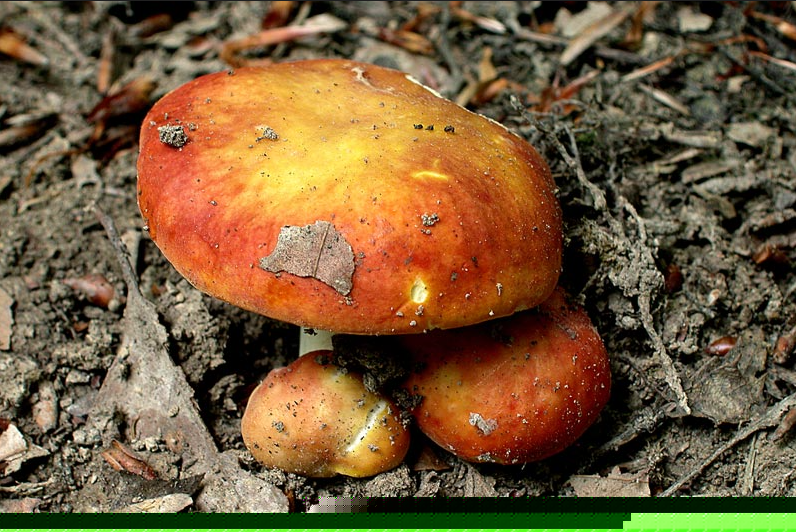

In [5]:
for problem in problematic_images:
    os.remove(problem)
    print(f"Deleted problematic image: {problem}")

print(f"Total problematic images deleted: {len(problematic_images)}")

Deleted problematic image: C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\Mushrooms\Russula\092_43B354vYxm8.jpg
Total problematic images deleted: 1


Next I'll check for and delete duplicated pictures

In [6]:
def generate_image_hash(image_path):
    with Image.open(image_path) as img:
        img = img.resize((256, 256)).convert('RGB')
        img_array = np.array(img)
        img_hash = hashlib.md5(img_array.tobytes()).hexdigest()
    return img_hash

image_dir = r"C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms"
image_hashes = {}
duplicates = []

for root, _, files in os.walk(image_dir):
    for file in files:
        if file.endswith((".png", ".jpg", ".jpeg")):
            file_path = os.path.join(root, file)
            img_hash = generate_image_hash(file_path)
            if img_hash in image_hashes:
                duplicates.append(file_path)
            else:
                image_hashes[img_hash] = file_path

for duplicate in duplicates:
    os.remove(duplicate)
    print(f"Deleted duplicate: {duplicate}")

print(f"Total duplicates found and deleted: {len(duplicates)}")

Deleted duplicate: C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\Mushrooms\Agaricus\152_uLPPbLUrAro.jpg
Deleted duplicate: C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\Mushrooms\Agaricus\181_42srgvDitnE.jpg
Deleted duplicate: C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\Mushrooms\Amanita\140_2tM1nrJmAeY.jpg
Deleted duplicate: C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\Mushrooms\Amanita\765_EloICHZR9ow.jpg
Deleted duplicate: C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\Mushrooms\Boletus\0105_7lVm0lLO6FQ.jpg
Deleted duplicate: C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\Mushrooms\Boletus\0757_vqAhKJVV4y0.jpg
Deleted duplicate: C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\Mushrooms\Cortinarius\101_c0c-rcWwaSo.jpg
Deleted duplicate: C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\Mushrooms\Cortinarius\445_FGpuhpGk3Ao.jpg
Deleted duplicate: C:\Users\Liberty\Desktop\CodingPr

Now I want to make sure the remaining pictures are all of mushrooms! 

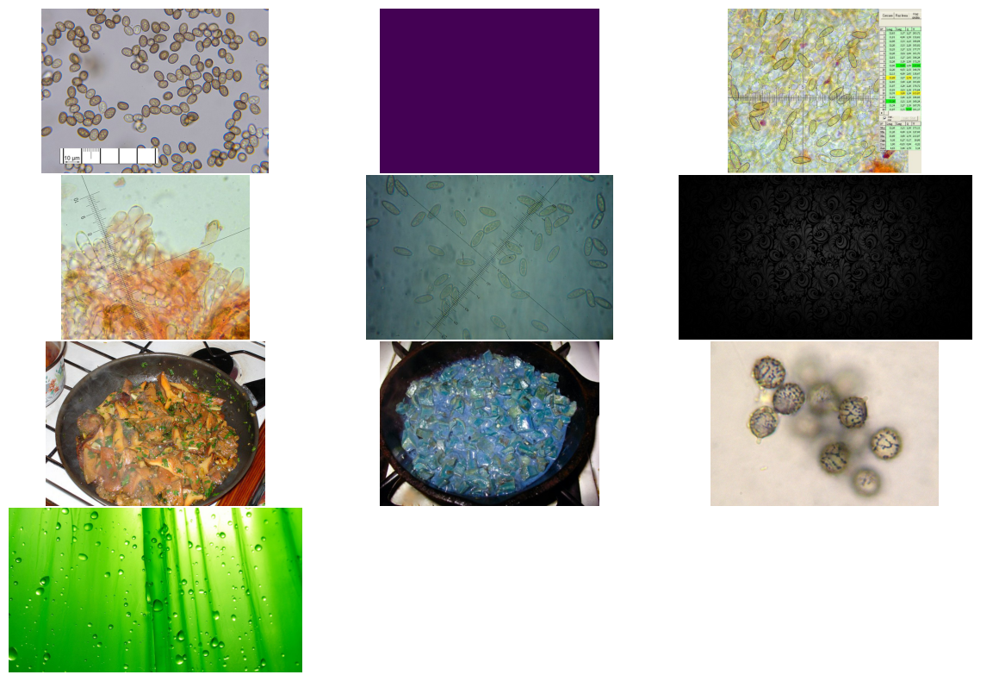

In [14]:
specific_filenames = [
    "151_yX7oI-mM9hk.jpg",
    "127_A77QQ1QPZ1E.jpg",
    "0051_rBIC-Uy9KzI.jpg",
    "0572_zdESww0j-to.jpg",
    "0573_O4Ftoobc-mM.jpg",
    "0726_wNJGG_syL80.jpg",
    "043_a_5lm55zCVc.jpg",
    "0127_1R8TZJseXgY.jpg",
    "0359_GY1BVriI5RQ.jpg",
    "273_ZwxysL6gjVQ.jpg"
]

def display_specific_images(image_dir, filenames, columns=3, width=15, height=10):
    image_paths = []
    
    for root, _, files in os.walk(image_dir):
        for file in files:
            if file in filenames:
                image_paths.append(os.path.join(root, file))
    
    rows = (len(image_paths) + columns - 1) // columns 
    fig, axes = plt.subplots(rows, columns, figsize=(width, height))
    axes = axes.flatten()
    
    for ax, image_path in zip(axes, image_paths):
        img = Image.open(image_path)
        ax.imshow(img)
        ax.axis('off')
    
    for ax in axes[len(image_paths):]:
        ax.axis('off')
        
    plt.subplots_adjust(wspace=0.01, hspace=0.01) 
    plt.show()

image_dir = r"C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms" 

display_specific_images(image_dir, specific_filenames, columns=3, width=15, height=10)

In [15]:
def delete_specific_images(image_dir, filenames):
    for root, _, files in os.walk(image_dir):
        for file in files:
            if file in filenames:
                file_path = os.path.join(root, file)
                try:
                    os.remove(file_path)
                    print(f"Deleted {file_path}")
                except Exception as e:
                    print(f"Error deleting {file_path}: {e}")

delete_specific_images(image_dir, specific_filenames)

Deleted C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\Mushrooms\Agaricus\273_ZwxysL6gjVQ.jpg
Deleted C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\Mushrooms\Boletus\0051_rBIC-Uy9KzI.jpg
Deleted C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\Mushrooms\Boletus\0572_zdESww0j-to.jpg
Deleted C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\Mushrooms\Boletus\0573_O4Ftoobc-mM.jpg
Deleted C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\Mushrooms\Boletus\0726_wNJGG_syL80.jpg
Deleted C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\Mushrooms\Lactarius\0127_1R8TZJseXgY.jpg
Deleted C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\Mushrooms\Lactarius\0359_GY1BVriI5RQ.jpg
Deleted C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\Mushrooms\Lactarius\127_A77QQ1QPZ1E.jpg
Deleted C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\Mushrooms\Russula\043_a_5lm55zCVc.jpg
Deleted C:\Users\Liberty\Desktop\

# EDA

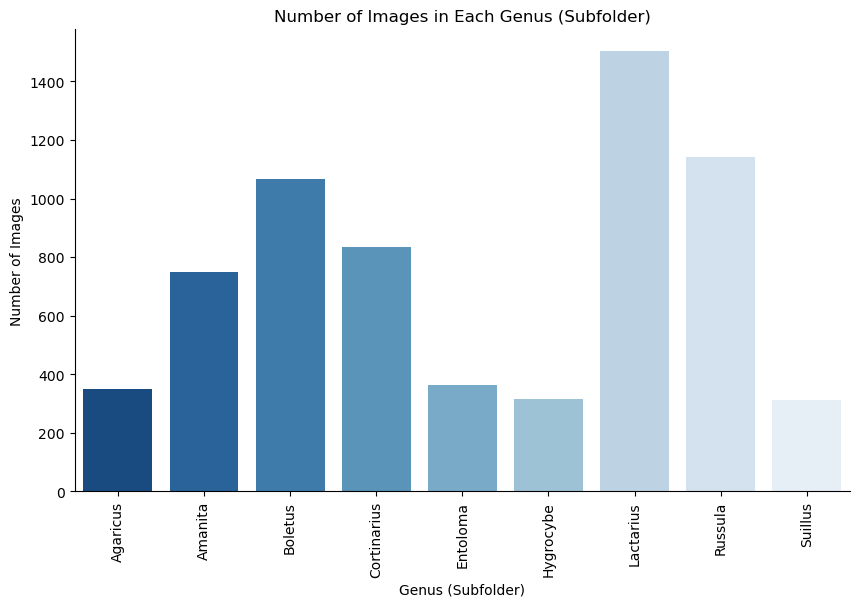

In [24]:
image_counts = {}

for root, dirs, files in os.walk(image_dir):
    for dir in dirs:
        if dir == "Mushrooms":
            continue  
        dir_path = os.path.join(root, dir)
        count = len([file for file in os.listdir(dir_path) if file.endswith((".png", ".jpg", ".jpeg"))])
        image_counts[dir] = count

image_counts_df = pd.DataFrame(list(image_counts.items()), columns=['Genus', 'ImageCount'])

create_plot(
    data=image_counts_df,
    x_col='Genus',
    y_col='ImageCount',
    plot_type='bar',
    title='Number of Images in Each Genus (Subfolder)',
    x_label='Genus (Subfolder)',
    y_label='Number of Images'
)

## Test, Validation, Test Split

In [26]:
def split_data_stratified(image_dir, train_size=0.6, val_size=0.2, test_size=0.2):
    assert train_size + val_size + test_size == 1, "Splits must sum to 1"
    
    subfolders = [f.path for f in os.scandir(image_dir) if f.is_dir()]
    file_paths = []
    labels = []
    
    for subfolder in subfolders:
        files = [f for f in os.listdir(subfolder) if os.path.isfile(os.path.join(subfolder, f))]
        file_paths.extend([os.path.join(subfolder, f) for f in files])
        labels.extend([os.path.basename(subfolder)] * len(files))
    
    strat_split = StratifiedShuffleSplit(n_splits=1, test_size=(val_size + test_size), random_state=42)
    for train_idx, test_val_idx in strat_split.split(file_paths, labels):
        train_files = [file_paths[i] for i in train_idx]
        test_val_files = [file_paths[i] for i in test_val_idx]
        test_val_labels = [labels[i] for i in test_val_idx]
    
    strat_split_val = StratifiedShuffleSplit(n_splits=1, test_size=test_size/(val_size + test_size), random_state=42)
    for val_idx, test_idx in strat_split_val.split(test_val_files, test_val_labels):
        val_files = [test_val_files[i] for i in val_idx]
        test_files = [test_val_files[i] for i in test_idx]
    
    os.makedirs(os.path.join(image_dir, 'train'), exist_ok=True)
    os.makedirs(os.path.join(image_dir, 'val'), exist_ok=True)
    os.makedirs(os.path.join(image_dir, 'test'), exist_ok=True)
    
    def move_files(file_list, dest_dir):
        for file in file_list:
            label = os.path.basename(os.path.dirname(file))
            dest_folder = os.path.join(dest_dir, label)
            os.makedirs(dest_folder, exist_ok=True)
            shutil.move(file, os.path.join(dest_folder, os.path.basename(file)))
    
    move_files(train_files, os.path.join(image_dir, 'train'))
    move_files(val_files, os.path.join(image_dir, 'val'))
    move_files(test_files, os.path.join(image_dir, 'test'))

image_dir = r"C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms" 
split_data_stratified(image_dir)

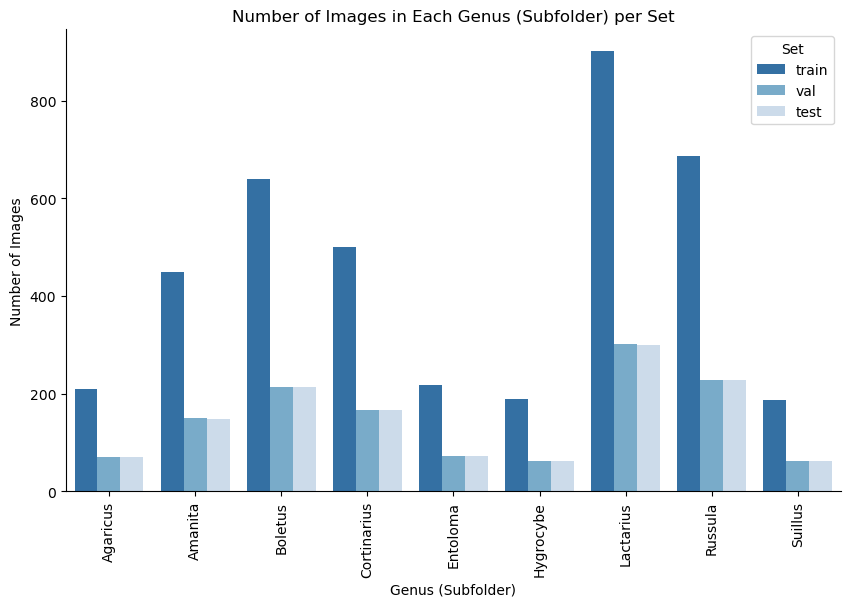

In [31]:
def count_images_in_sets(image_dir, sets=['train', 'val', 'test']):
    image_counts = defaultdict(lambda: defaultdict(int))
    
    for dataset in sets:
        dataset_dir = os.path.join(image_dir, dataset)
        if not os.path.exists(dataset_dir):
            continue
        for subfolder in os.listdir(dataset_dir):
            subfolder_path = os.path.join(dataset_dir, subfolder)
            if os.path.isdir(subfolder_path):
                count = len([file for file in os.listdir(subfolder_path) if file.endswith((".png", ".jpg", ".jpeg"))])
                image_counts[dataset][subfolder] = count
    
    return image_counts

image_counts = count_images_in_sets(image_dir)

df = pd.DataFrame(image_counts).fillna(0).astype(int).reset_index().melt(id_vars=['index'])
df.columns = ['Genus', 'Set', 'ImageCount']

create_plot(
    data=df,
    x_col='Genus',
    y_col='ImageCount',
    plot_type='bar',
    title='Number of Images in Each Genus (Subfolder) per Set',
    x_label='Genus (Subfolder)',
    y_label='Number of Images',
    hue='Set'
)

The bar chart depicts the number of images in each genus (subfolder) across three different datasets: train, validation (val), and test sets. The genera included are Agaricus, Amanita, Boletus, Cortinarius, Entoloma, Hygrocybe, Lactarius, Russula, and Suillus.

**Key Insights**:
1. **Lactarius** has the highest number of images overall, indicating it's the most abundant genus in this dataset.
2. **Boletus** and **Russula** also have a significant number of images, which suggests these genera are well-represented.
3. **Entoloma** and **Hygrocybe** have the fewest images across all datasets, and might pose challenges in terms of data availability for model training.
4. The **training set** consistently contains more images than the validation and test sets across all genera, which is typical for machine learning datasets to ensure robust model training.
5. The distribution of images across the validation and test sets appears to be more balanced compared to the training set, which is crucial for evaluating model performance fairly.

## Metadata

In [55]:
def get_image_metadata(image_dir, sets=['train', 'val', 'test']):
    metadata = []

    for dataset in sets:
        dataset_dir = os.path.join(image_dir, dataset)
        if not os.path.exists(dataset_dir):
            continue
        for subfolder in os.listdir(dataset_dir):
            subfolder_path = os.path.join(dataset_dir, subfolder)
            if os.path.isdir(subfolder_path):
                class_code = subfolder
                for file in os.listdir(subfolder_path):
                    if file.endswith((".png", ".jpg", ".jpeg")):
                        file_path = os.path.join(subfolder_path, file)
                        file_size = os.path.getsize(file_path) / 1024  # size in KB
                        with Image.open(file_path) as img:
                            width, height = img.size
                            format = img.format
                            mode = img.mode
                        metadata.append({
                            'Set': dataset,
                            'ClassLabel': subfolder,
                            'FileName': file,
                            'FilePath': file_path,
                            'FileSizeKB': file_size,
                            'Width': width,
                            'Height': height,
                            'Format': format,
                            'Mode': mode
                        })
    
    return pd.DataFrame(metadata)

image_dir = r"C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms"  # Update this path

metadata_df = get_image_metadata(image_dir)

metadata_df.head()

,Set,ClassLabel,FileName,FilePath,FileSizeKB,Width,Height,Format,Mode
0,train,Agaricus,002_hNh3aQSH-ZM.jpg,C:\Users\Liberty\Desktop\CodingProjects\mushro...,138.177734,700,524,JPEG,RGB
1,train,Agaricus,003_4AurAO4Jil8.jpg,C:\Users\Liberty\Desktop\CodingProjects\mushro...,179.734375,800,600,JPEG,RGB
2,train,Agaricus,005_sUqyy4Yb9VY.jpg,C:\Users\Liberty\Desktop\CodingProjects\mushro...,53.032227,800,539,JPEG,RGB
3,train,Agaricus,006_1_E6AXBJqn4.jpg,C:\Users\Liberty\Desktop\CodingProjects\mushro...,127.210938,800,600,JPEG,RGB
4,train,Agaricus,009_mrv34Sn4WiQ.jpg,C:\Users\Liberty\Desktop\CodingProjects\mushro...,87.887695,771,600,JPEG,RGB


In [56]:
metadata_df.tail()

,Set,ClassLabel,FileName,FilePath,FileSizeKB,Width,Height,Format,Mode
6629,test,Suillus,303_BNtkiBnOy2Y.jpg,C:\Users\Liberty\Desktop\CodingProjects\mushro...,166.655273,800,536,JPEG,RGB
6630,test,Suillus,309_21D8I2bjRnI.jpg,C:\Users\Liberty\Desktop\CodingProjects\mushro...,190.155273,800,600,JPEG,RGB
6631,test,Suillus,324_nslhbQyQ1Gk.jpg,C:\Users\Liberty\Desktop\CodingProjects\mushro...,144.930664,800,632,JPEG,RGB
6632,test,Suillus,328_o1Ww-xmCEIY.jpg,C:\Users\Liberty\Desktop\CodingProjects\mushro...,97.192383,620,471,JPEG,RGB
6633,test,Suillus,335_n1jQ-n_Pb4U.jpg,C:\Users\Liberty\Desktop\CodingProjects\mushro...,303.315430,1200,900,JPEG,RGB


In [35]:
metadata_df.describe()

,FileSizeKB,Width,Height
count,6634.000000,6634.000000,6634.000000
mean,144.622389,796.167320,579.985228
std,59.092304,132.975762,100.531729
min,7.492188,259.000000,152.000000
25%,108.070312,800.000000,533.000000
50%,142.206055,800.000000,581.000000
75%,172.578613,800.000000,600.000000
max,586.873047,1280.000000,1024.000000


In [57]:
metadata_df.nunique()

Set              3
ClassLabel       9
FileName      6634
FilePath      6634
FileSizeKB    6519
Width          363
Height         505
Format           1
Mode             1
dtype: int64

In [37]:
metadata_df.Format.value_counts()

Format
JPEG    6634
Name: count, dtype: int64

In [38]:
metadata_df.Mode.value_counts()

Mode
RGB    6634
Name: count, dtype: int64

Seeing as all the images in the are both JPEG format and RGB mode, we can drop those two columns.

In [59]:
metadata_df = metadata_df.drop(columns=['Format', 'Mode'])

In [60]:
metadata_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6634 entries, 0 to 6633
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Set         6634 non-null   object 
 1   ClassLabel  6634 non-null   object 
 2   FileName    6634 non-null   object 
 3   FilePath    6634 non-null   object 
 4   FileSizeKB  6634 non-null   float64
 5   Width       6634 non-null   int64  
 6   Height      6634 non-null   int64  
dtypes: float64(1), int64(2), object(4)
memory usage: 362.9+ KB


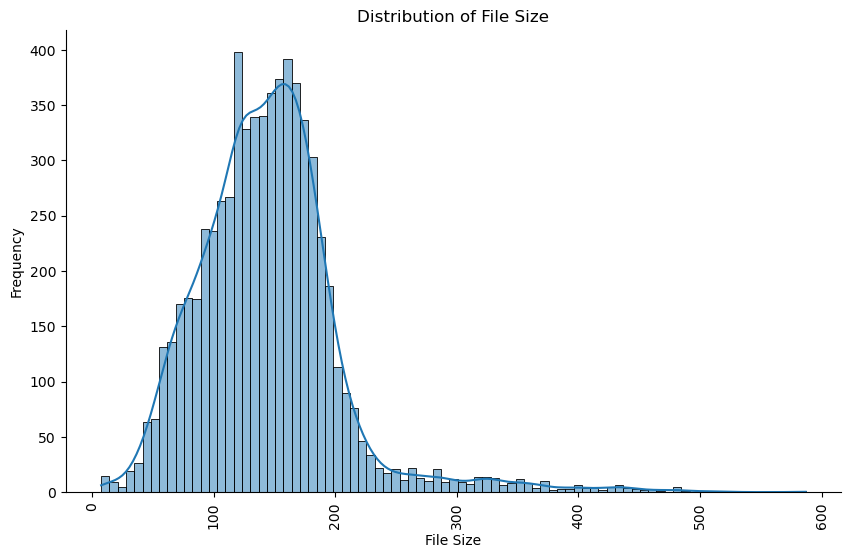

In [43]:
create_plot(
    data=metadata_df,
    x_col='FileSizeKB',
    plot_type='hist',
    title='Distribution of File Size',
    x_label='File Size',
    y_label='Frequency'
)

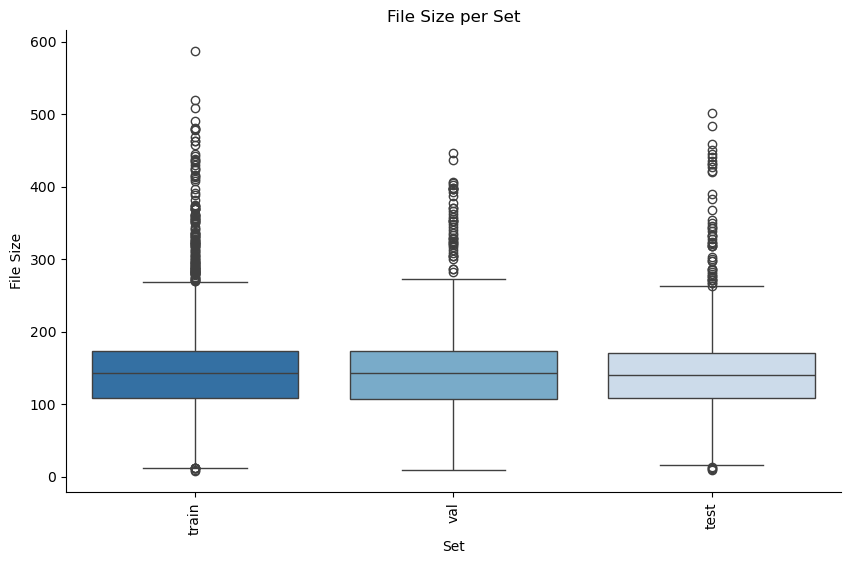

In [47]:
create_plot(
    data=metadata_df,
    x_col='Set',
    y_col='FileSizeKB',
    plot_type='box',
    title='File Size per Set',
    x_label='Set',
    y_label='File Size'
)

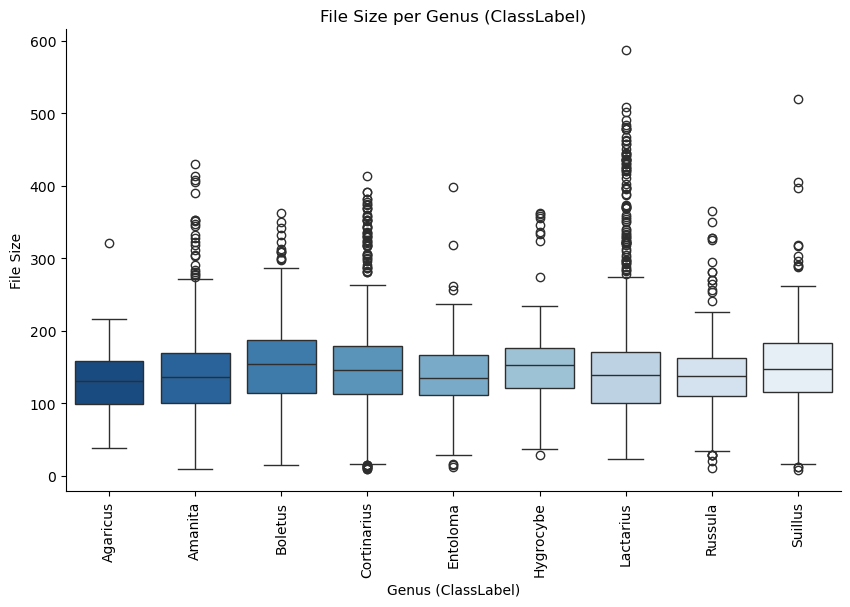

In [48]:
create_plot(
    data=metadata_df,
    x_col='ClassLabel',
    y_col='FileSizeKB',
    plot_type='box',
    title='File Size per Genus (ClassLabel)',
    x_label='Genus (ClassLabel)',
    y_label='File Size',
    hue=None
)

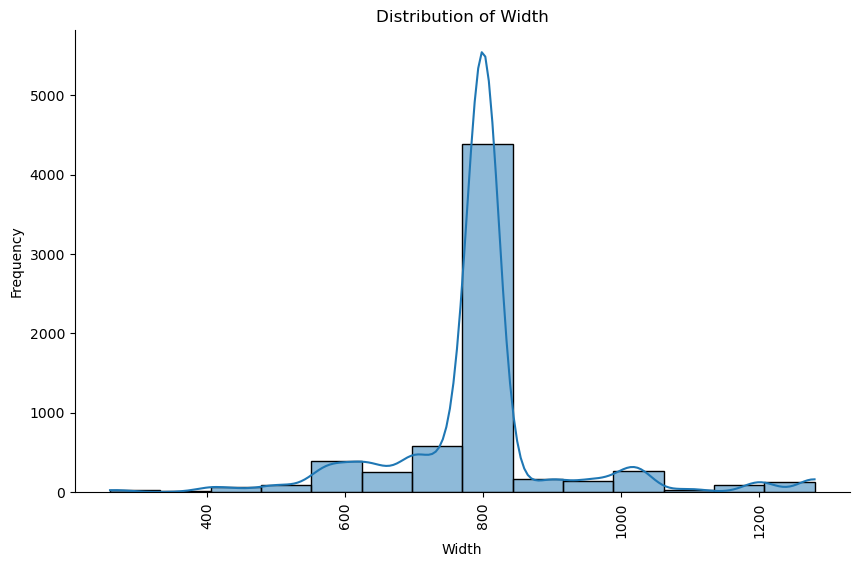

In [49]:
create_plot(
    data=metadata_df,
    x_col='Width',
    plot_type='hist',
    title='Distribution of Width',
    x_label='Width',
    y_label='Frequency'
)

**Distribution of Width**:
   - The histogram shows that the width of images in the dataset is most commonly around 800 pixels, with a sharp peak at this value. 
   - There are some images with widths as low as around 400 pixels and as high as 1200 pixels, but these are much less frequent.
   - This indicates that the dataset is relatively consistent in terms of image width, with most images centered around a standard width of 800 pixels.

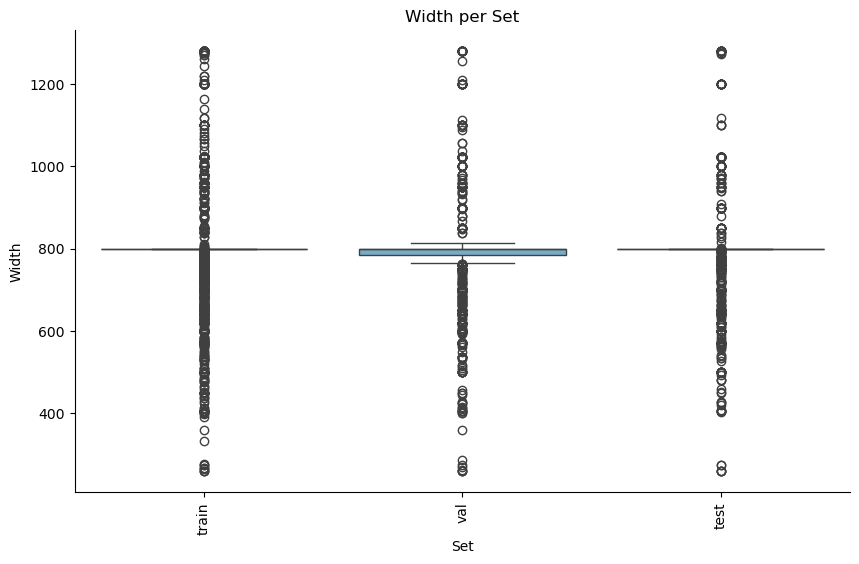

In [50]:
create_plot(
    data=metadata_df,
    x_col='Set',
    y_col='Width',
    plot_type='box',
    title='Width per Set',
    x_label='Set',
    y_label='Width'
)

**Width per Set**:
   - The box plot compares the width of images across different dataset splits (train, val, test).
   - All three sets show a similar distribution of widths, with medians close to 800 pixels.
   - There is a significant number of outliers in each set, particularly in the higher range (above 800 pixels), indicating that while most images have a standard width, there are a few that are either much wider or narrower.

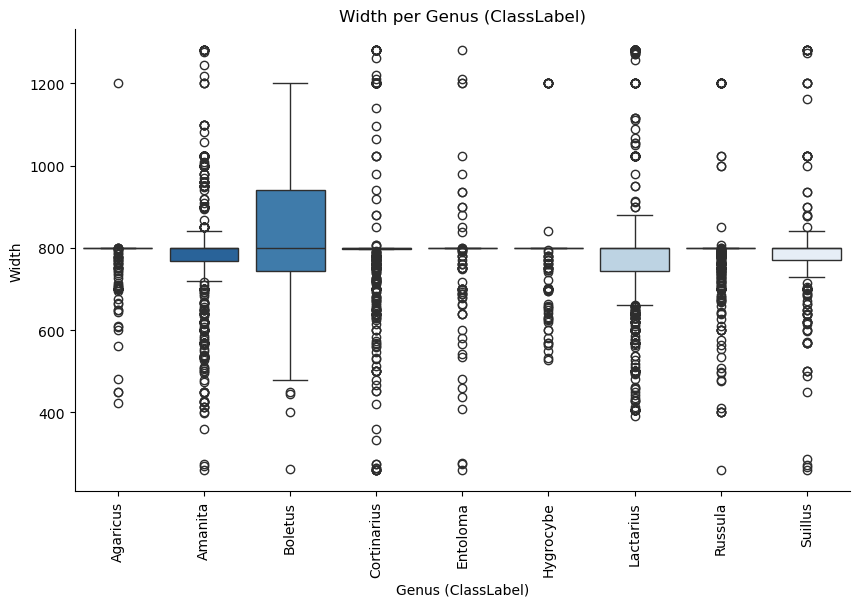

In [51]:
create_plot(
    data=metadata_df,
    x_col='ClassLabel',
    y_col='Width',
    plot_type='box',
    title='Width per Genus (ClassLabel)',
    x_label='Genus (ClassLabel)',
    y_label='Width',
    hue=None
)

**Width per Genus**:
   - This plot shows the distribution of image widths for different genera.
   - Most genera have a median width of around 800 pixels, consistent with the overall distribution.
   - **Boletus** exhibits a wider range of widths, with a larger interquartile range (IQR) and more outliers, indicating a higher variability in image sizes for this genus.
   - Other genera like **Agaricus** and **Russula** have narrower IQRs, suggesting more consistent image sizes within these categories.

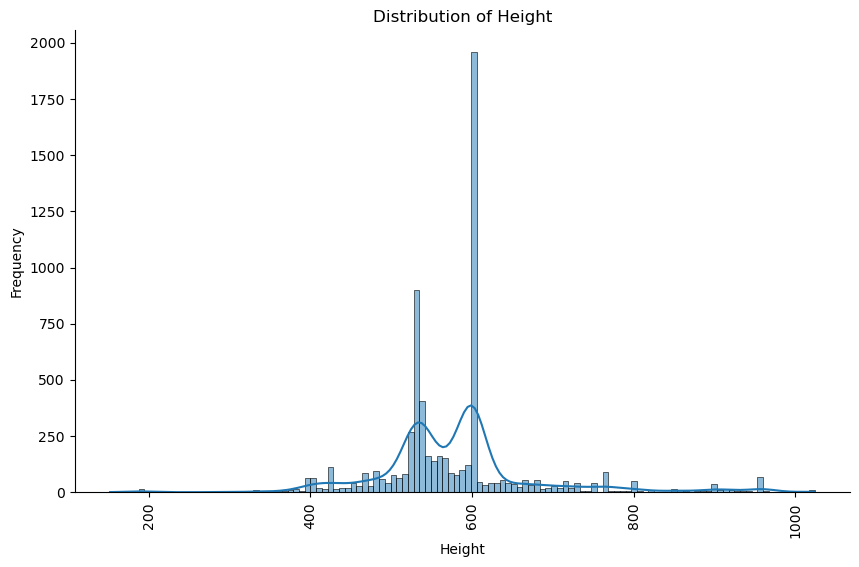

In [52]:
create_plot(
    data=metadata_df,
    x_col='Height',
    plot_type='hist',
    title='Distribution of Height',
    x_label='Height',
    y_label='Frequency'
)

**Distribution of Height**:
   - The histogram for image height shows a bimodal distribution, with two prominent peaks.
   - The highest peak occurs at 600 pixels, indicating that this is the most common image height in the dataset.
   - There are also smaller numbers of images with heights below 400 pixels and up to around 1000 pixels.
   - This suggests some variation in image height, but with a strong concentration around 600 pixels.

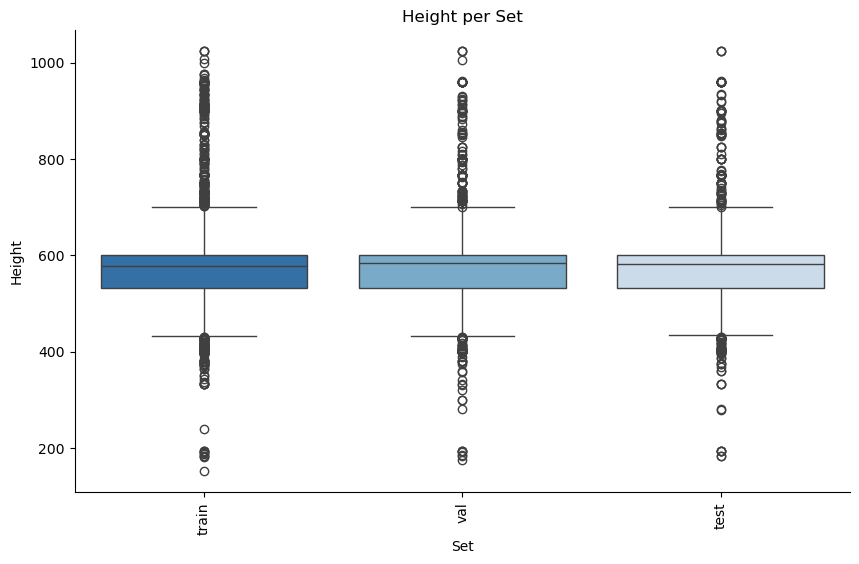

In [53]:
create_plot(
    data=metadata_df,
    x_col='Set',
    y_col='Height',
    plot_type='box',
    title='Height per Set',
    x_label='Set',
    y_label='Height'
)

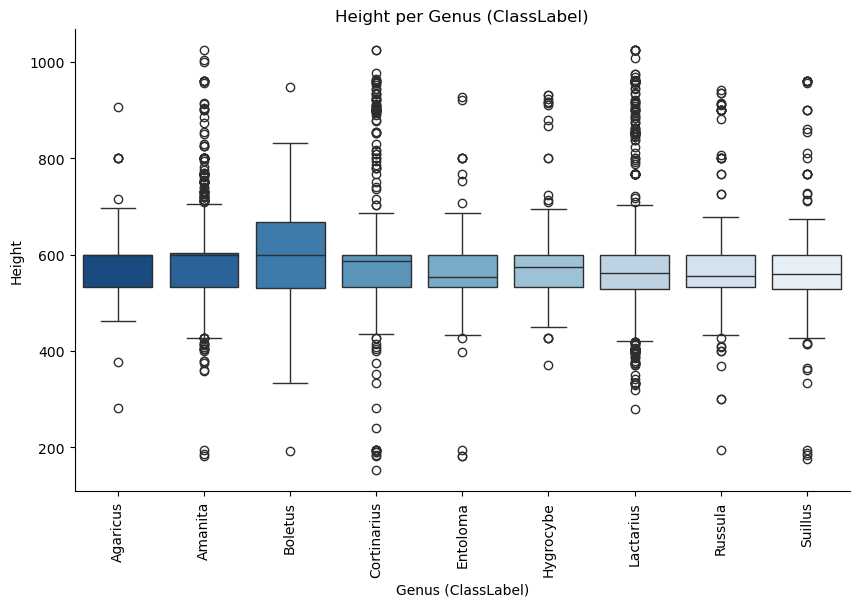

In [54]:
create_plot(
    data=metadata_df,
    x_col='ClassLabel',
    y_col='Height',
    plot_type='box',
    title='Height per Genus (ClassLabel)',
    x_label='Genus (ClassLabel)',
    y_label='Height',
    hue=None
)

**Height per Genus**:
   - Most genera have median heights around 600 pixels, consistent with the dominant peak in the height distribution.
   - **Boletus** again shows more variability in image height, with a wider IQR and more outliers.
   - Genera like **Agaricus** and **Russula** have narrower IQRs, indicating less variability and more consistent image heights within these groups.

## Resizing

In [86]:
metadata_df['min_width_height'] = metadata_df[['Width', 'Height']].min(axis=1)

metadata_less_244 = metadata_df.query("Width < 224 | Height < 224")

print(
    f"Number of images with smaller dimension (either width or height) less than 224 px: \n"
    f"{len(metadata_less_244)} out of {len(metadata_df)} "
    f"({len(metadata_less_244)/len(metadata_df):.1%})"
)

Number of images with smaller dimension (either width or height) less than 224 px: 
23 out of 6634 (0.3%)


First I'm identifying images where either the width or height is less than 224 pixels and counting how many of them there are. It's a very small fraction.

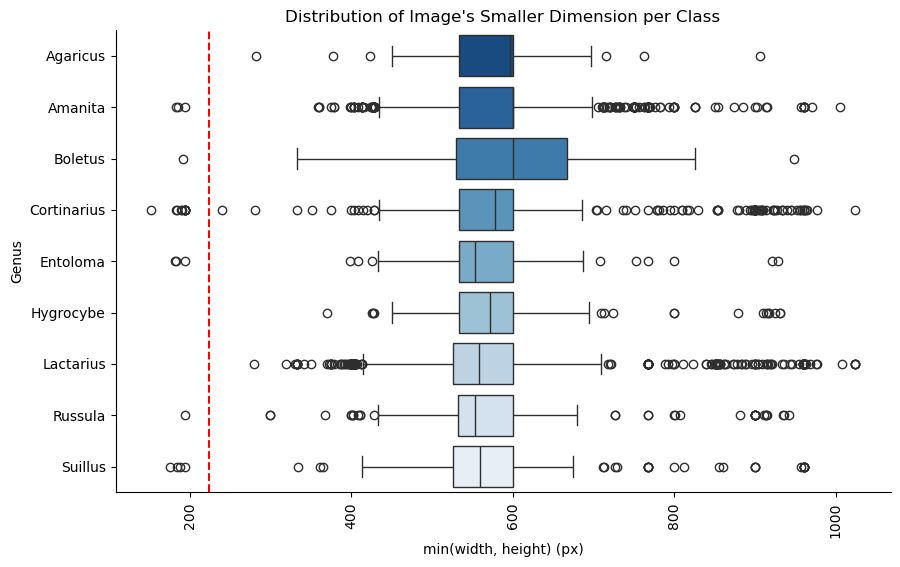

In [87]:
def create_custom_plot(data, x_col, y_col, title='', x_label='', y_label='', hue=None):
    plt.figure(figsize=(10, 6))
    palette = "Blues_r"

    if hue and pd.api.types.is_numeric_dtype(data[hue]):
        data = data.copy()
        data[hue] = data[hue].astype(str)

    if hue:
        ax = sns.boxplot(x=x_col, y=y_col, data=data, hue=hue, palette=palette)
    else:
        ax = sns.boxplot(x=x_col, y=y_col, data=data, palette=palette)

    plt.axvline(x=224, color='r', linestyle='--')

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    plt.title(title)
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    rotate_ticks = 90 if len(ax.get_xticklabels()) > 10 or any(len(label.get_text()) >= 4 for label in ax.get_xticklabels()) else 0
    plt.xticks(rotation=rotate_ticks)
    plt.show()

create_custom_plot(
    data=metadata_df,
    x_col='min_width_height',
    y_col='ClassLabel',
    title="Distribution of Image's Smaller Dimension per Class",
    x_label="min(width, height) (px)",
    y_label="Genus"
)

In [88]:
metadata_less_244.style.applymap(
    lambda x: "background-color: green" if x < 224 else "",
    subset=['Width', 'Height']
).format(precision=1)

,Set,ClassLabel,FileName,FilePath,FileSizeKB,Width,Height,min_width_height
451,train,Amanita,406_XzBTfW6Y0fg.jpg,C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\train\Amanita\406_XzBTfW6Y0fg.jpg,11.6,259,194,194
1368,train,Cortinarius,123_d68nNwG_WC8.jpg,C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\train\Cortinarius\123_d68nNwG_WC8.jpg,14.4,259,194,194
1449,train,Cortinarius,266_y3AyAuEFapc.jpg,C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\train\Cortinarius\266_y3AyAuEFapc.jpg,11.9,274,184,184
1455,train,Cortinarius,277_2vcjLHvzssg.jpg,C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\train\Cortinarius\277_2vcjLHvzssg.jpg,11.4,266,190,190
1546,train,Cortinarius,426_odwjbZuqcYQ.jpg,C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\train\Cortinarius\426_odwjbZuqcYQ.jpg,12.1,259,194,194
1746,train,Cortinarius,851_9ZM2daeZA4g.jpg,C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\train\Cortinarius\851_9ZM2daeZA4g.jpg,9.4,264,191,191
1749,train,Cortinarius,854_DZvBq6nZr2k.jpg,C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\train\Cortinarius\854_DZvBq6nZr2k.jpg,11.9,332,152,152
1955,train,Entoloma,285_v-EfRQu4rB4.jpg,C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\train\Entoloma\285_v-EfRQu4rB4.jpg,14.6,276,182,182
3834,train,Suillus,078__gVuarfZBiQ.jpg,C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\train\Suillus\078__gVuarfZBiQ.jpg,12.5,273,184,184
3970,train,Suillus,317_41mNOdPZlRo.jpg,C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\train\Suillus\317_41mNOdPZlRo.jpg,7.5,268,188,188


This table lists specific images that have either width or height less than 224 pixels. The `min_width_height` column highlights these small dimensions, with those below 224 pixels marked in green.

In [140]:
def copy_directory_structure(src, dst):
    if not os.path.exists(dst):
        os.makedirs(dst)
    for root, dirs, files in os.walk(src):
        if 'resized' in root:
            continue
        for dir_ in dirs:
            os.makedirs(os.path.join(dst, os.path.relpath(os.path.join(root, dir_), src)), exist_ok=True)

def copy_files(src, dst):
    for root, dirs, files in os.walk(src):
        if 'resized' in root:
            continue
        for file in files:
            src_file = os.path.join(root, file)
            dst_file = os.path.join(dst, os.path.relpath(src_file, src))
            shutil.copy2(src_file, dst_file)

original_dir = r"C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms"
resized_dir = os.path.join(original_dir, "resized")

copy_directory_structure(original_dir, resized_dir)
copy_files(original_dir, resized_dir)

Here I'm just copying the directory structure and files to ensure the structure stays intact in preparation for processing. I want to make sure I keep the original data in case something goes wrong later on down the line, I don't have to redo all the work that's taken place up till now. 

In [141]:
def resize_image(image_path, output_width=224):
    with Image.open(image_path) as img:
        aspect_ratio = img.height / img.width
        output_height = int(output_width * aspect_ratio)
        resized_img = img.resize((output_width, output_height))
        return resized_img

resized_dir = r"C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\resized"

os.makedirs(resized_dir, exist_ok=True)

for root, _, files in os.walk(image_dir):
    for file in files:
        if file.endswith((".png", ".jpg", ".jpeg")):
            file_path = os.path.join(root, file)
            rel_dir = os.path.relpath(root, image_dir)
            dest_dir = os.path.join(resized_dir, rel_dir)
            os.makedirs(dest_dir, exist_ok=True)

            resized_img = resize_image(file_path, output_width=224)
            resized_img.save(os.path.join(dest_dir, file))

print("All images have been resized.")

All images have been resized.


Here, I've resized the images so that their smaller dimension is at least 224 pixels while preserving their aspect ratio. Then the resized images are saved to a different directory.

In [112]:
def gather_metadata(image_dir):
    data = []
    for root, _, files in os.walk(image_dir):
        for file in files:
            if file.endswith((".png", ".jpg", ".jpeg")):
                file_path = os.path.join(root, file)
                with Image.open(file_path) as img:
                    width, height = img.size
                    file_size = os.path.getsize(file_path) / 1024  
                    dataset = os.path.basename(os.path.dirname(root))
                    subfolder = os.path.basename(root)
                    format = img.format
                    mode = img.mode
                    data.append({
                        'Set': dataset,
                        'ClassLabel': subfolder,
                        'FileName': file,
                        'FilePath': file_path,
                        'FileSizeKB': file_size,
                        'Width': width,
                        'Height': height,
                        'Format': format,
                        'Mode': mode
                    })
    return pd.DataFrame(data)

resized_dir = r"C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\resized"  

metadata_resized_df = gather_metadata(resized_dir)
print(metadata_resized_df.head())

    Set ClassLabel             FileName  \
0  test   Agaricus  000_ePQknW8cTp8.jpg   
1  test   Agaricus  027_-CwuQDPShnA.jpg   
2  test   Agaricus  028_-vDPakMKna4.jpg   
3  test   Agaricus  034_Cnyn7hmoUvQ.jpg   
4  test   Agaricus  036_3LF5Y5Y_Q70.jpg   

                                            FilePath  FileSizeKB  Width  \
0  C:\Users\Liberty\Desktop\CodingProjects\mushro...    8.769531    224   
1  C:\Users\Liberty\Desktop\CodingProjects\mushro...   10.298828    224   
2  C:\Users\Liberty\Desktop\CodingProjects\mushro...   10.568359    224   
3  C:\Users\Liberty\Desktop\CodingProjects\mushro...   12.776367    224   
4  C:\Users\Liberty\Desktop\CodingProjects\mushro...   11.581055    224   

   Height Format Mode  
0     172   JPEG  RGB  
1     149   JPEG  RGB  
2     168   JPEG  RGB  
3     168   JPEG  RGB  
4     168   JPEG  RGB  


In [113]:
metadata_resized_df.tail()

,Set,ClassLabel,FileName,FilePath,FileSizeKB,Width,Height,Format,Mode
6629,val,Suillus,311_MfqUejCCW5s.jpg,C:\Users\Liberty\Desktop\CodingProjects\mushro...,15.622070,224,168,JPEG,RGB
6630,val,Suillus,318_C2et27XKNKQ.jpg,C:\Users\Liberty\Desktop\CodingProjects\mushro...,9.326172,224,167,JPEG,RGB
6631,val,Suillus,329__Mnu8MqkPBc.jpg,C:\Users\Liberty\Desktop\CodingProjects\mushro...,8.506836,224,143,JPEG,RGB
6632,val,Suillus,332_yhuZkvWUHSw.jpg,C:\Users\Liberty\Desktop\CodingProjects\mushro...,10.714844,224,155,JPEG,RGB
6633,val,Suillus,334_tepwic_Btvc.jpg,C:\Users\Liberty\Desktop\CodingProjects\mushro...,9.743164,224,168,JPEG,RGB


In [114]:
metadata_resized_df.describe()

,FileSizeKB,Width,Height
count,6634.000000,6634.0,6634.000000
mean,10.524521,224.0,164.120139
std,1.971557,0.0,23.656645
min,2.712891,224.0,78.000000
25%,9.432617,224.0,149.000000
50%,10.528809,224.0,167.000000
75%,11.625488,224.0,168.000000
max,25.376953,224.0,399.000000


In [115]:
metadata_resized_df.nunique()

Set              3
ClassLabel       9
FileName      6634
FilePath      6634
FileSizeKB    4186
Width            1
Height         184
Format           1
Mode             1
dtype: int64

In [116]:
metadata_resized_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6634 entries, 0 to 6633
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Set         6634 non-null   object 
 1   ClassLabel  6634 non-null   object 
 2   FileName    6634 non-null   object 
 3   FilePath    6634 non-null   object 
 4   FileSizeKB  6634 non-null   float64
 5   Width       6634 non-null   int64  
 6   Height      6634 non-null   int64  
 7   Format      6634 non-null   object 
 8   Mode        6634 non-null   object 
dtypes: float64(1), int64(2), object(6)
memory usage: 466.6+ KB


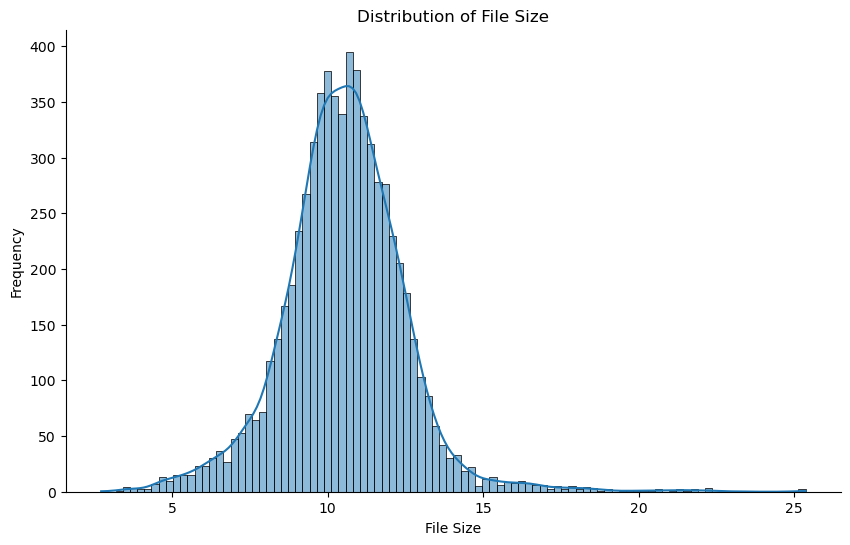

In [117]:
create_plot(
    data=metadata_resized_df,
    x_col='FileSizeKB',
    plot_type='hist',
    title='Distribution of File Size',
    x_label='File Size',
    y_label='Frequency'
)

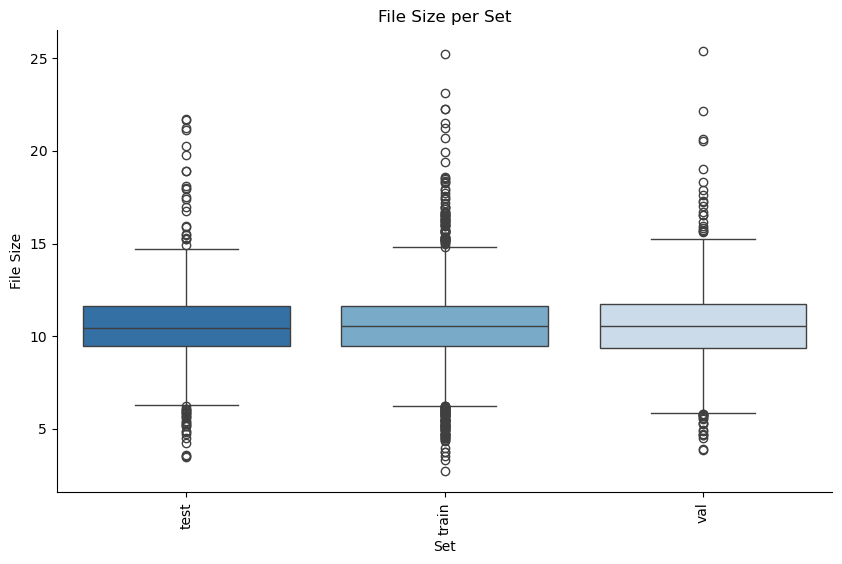

In [118]:
create_plot(
    data=metadata_resized_df,
    x_col='Set',
    y_col='FileSizeKB',
    plot_type='box',
    title='File Size per Set',
    x_label='Set',
    y_label='File Size'
)

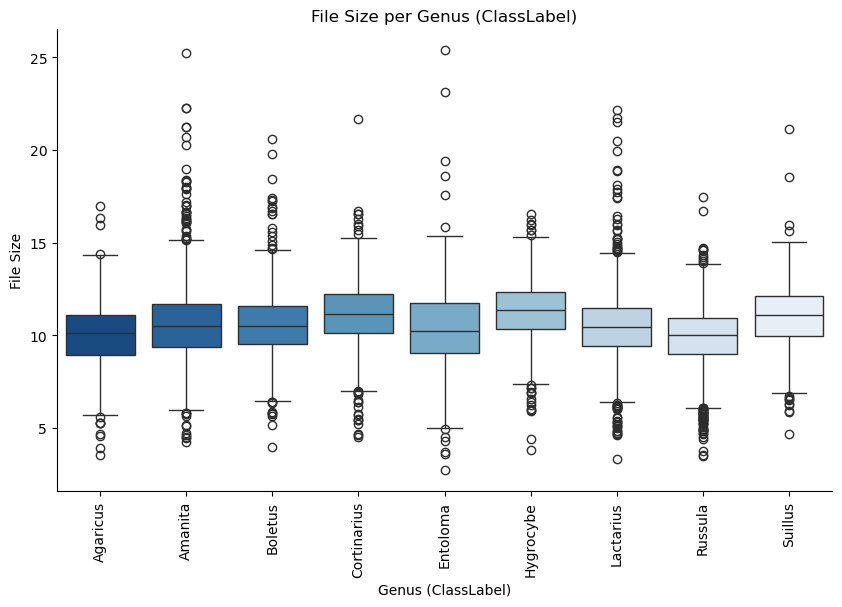

In [119]:
create_plot(
    data=metadata_resized_df,
    x_col='ClassLabel',
    y_col='FileSizeKB',
    plot_type='box',
    title='File Size per Genus (ClassLabel)',
    x_label='Genus (ClassLabel)',
    y_label='File Size',
    hue=None
)

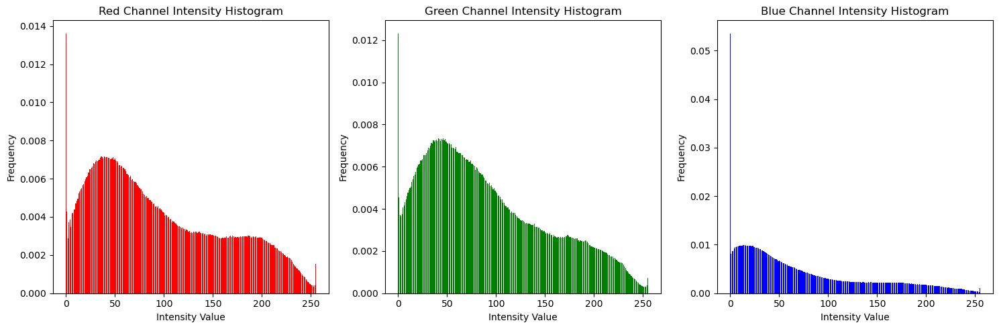

In [120]:
def plot_intensity_histograms(image_paths, max_images=100):
    r_hist = np.zeros(256)
    g_hist = np.zeros(256)
    b_hist = np.zeros(256)
    
    for i, image_path in enumerate(image_paths[:max_images]):
        with Image.open(image_path) as img:
            img = img.convert('RGB')
            np_img = np.array(img)
            r_hist += np.histogram(np_img[:, :, 0], bins=256, range=(0, 256))[0]
            g_hist += np.histogram(np_img[:, :, 1], bins=256, range=(0, 256))[0]
            b_hist += np.histogram(np_img[:, :, 2], bins=256, range=(0, 256))[0]
    
    r_hist /= r_hist.sum()
    g_hist /= g_hist.sum()
    b_hist /= b_hist.sum()
    
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.bar(range(256), r_hist, color='red')
    plt.title('Red Channel Intensity Histogram')
    plt.xlabel('Intensity Value')
    plt.ylabel('Frequency')
    
    plt.subplot(1, 3, 2)
    plt.bar(range(256), g_hist, color='green')
    plt.title('Green Channel Intensity Histogram')
    plt.xlabel('Intensity Value')
    plt.ylabel('Frequency')
    
    plt.subplot(1, 3, 3)
    plt.bar(range(256), b_hist, color='blue')
    plt.title('Blue Channel Intensity Histogram')
    plt.xlabel('Intensity Value')
    plt.ylabel('Frequency')
    
    plt.tight_layout()
    plt.show()

def gather_image_paths(image_dir):
    image_paths = []
    for root, _, files in os.walk(image_dir):
        for file in files:
            if file.endswith((".png", ".jpg", ".jpeg")):
                image_paths.append(os.path.join(root, file))
    return image_paths

resized_dir = r"C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\resized"  

image_paths = gather_image_paths(resized_dir)

plot_intensity_histograms(image_paths, max_images=100)

Red Channel Intensity Histogram

- High Frequency at Low Intensity: There is a significant spike at the lower intensity values (near 0). This indicates that there are many dark pixels in the red channel.
- Broad Distribution: The distribution is relatively broad and covers a wide range of intensity values, indicating a variety of red intensities across the images.

Green Channel Intensity Histogram

- Peak in Mid-Range: The histogram peaks around the mid-range intensity values (around 50-100). This suggests that there are many green pixels with medium intensity in the dataset.
- Gradual Decrease: The frequency gradually decreases as the intensity value increases, indicating fewer high-intensity green pixels.

Blue Channel Intensity Histogram

- Sharp Peak at Low Intensity: Similar to the red channel, there is a sharp peak at the lower intensity values, indicating a large number of dark pixels in the blue channel.
- Lower Overall Intensity: The distribution of the blue channel is generally skewed towards the lower intensity values, indicating that there are fewer bright blue pixels in the dataset compared to red and green.

General Observations

- Dark Pixels: The presence of spikes at the low intensity values in all three channels suggests that there are many dark areas in the images, which could be due to the natural environment of mushrooms, such as shadows, soil, or forest background.
- Color Distribution: The green channel shows a peak in the mid-range, which might be due to the presence of foliage, grass, or other green vegetation in the images. The red and blue channels show a broader distribution, indicating more variation in these color channels.

Implications for Preprocessing and Modeling

- Normalization: Given the variability in intensity distributions across the channels, it would be beneficial to normalize the images during preprocessing to ensure consistent input to my model.
- Data Augmentation: I will also be using data augmentation techniques such as brightness adjustment, contrast adjustment, and color jittering to introduce more variability and improve the robustness of the model.

## Histogram equalization

Histogram equalization is a technique used to improve the contrast in an image by redistributing the intensity values. This can help to enhance the visibility of features and make the image better for analysis. Histogram equalization works by mapping the original intensity values to a new distribution where the intensities are more uniformly spread out.

In [101]:
def equalize_histogram(image):
    img_array = np.array(image)
    
    ycrcb_img = cv2.cvtColor(img_array, cv2.COLOR_RGB2YCrCb)
    
    ycrcb_img[:, :, 0] = cv2.equalizeHist(ycrcb_img[:, :, 0])
    
    equalized_img = cv2.cvtColor(ycrcb_img, cv2.COLOR_YCrCb2RGB)

    equalized_img = Image.fromarray(equalized_img)
    
    return equalized_img

In [121]:
image_dir = r"C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\resized"  

for root, _, files in os.walk(image_dir):
    for file in files:
        if file.endswith((".png", ".jpg", ".jpeg")):
            file_path = os.path.join(root, file)
            with Image.open(file_path) as img:
                equalized_img = equalize_histogram(img)
                equalized_img.save(file_path)

print("Histogram equalization has been applied to all images.")

Histogram equalization has been applied to all images.


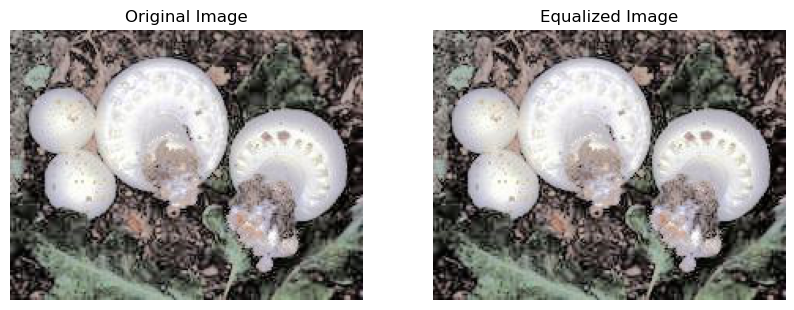

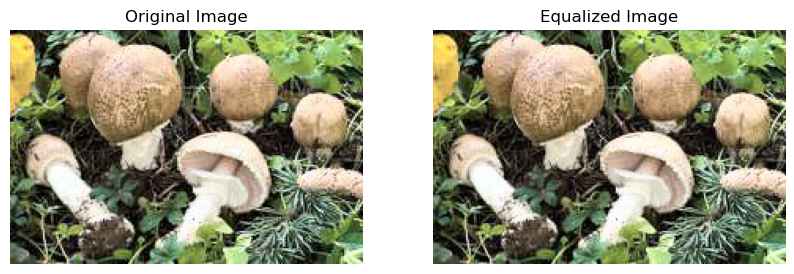

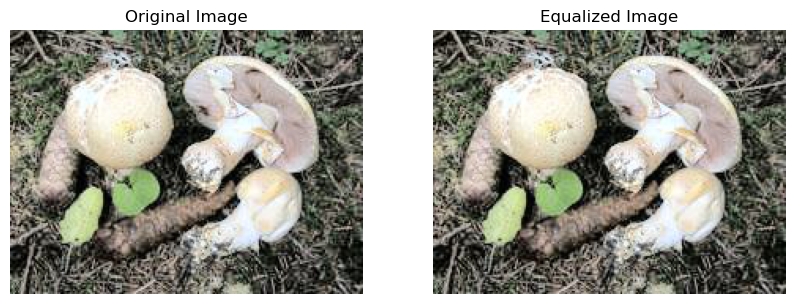

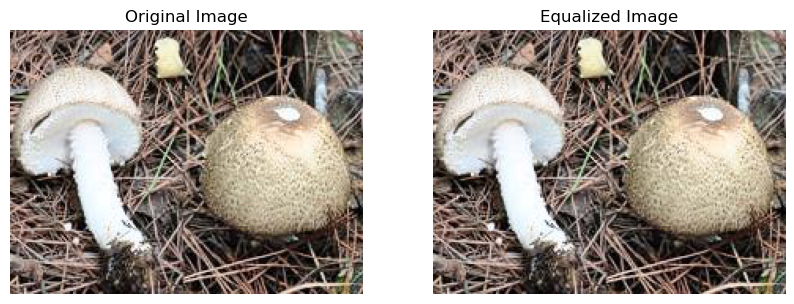

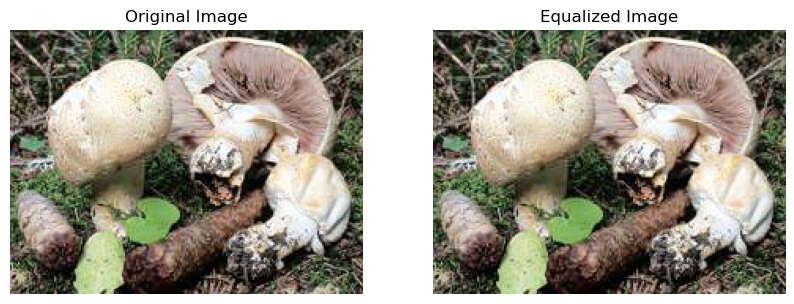

In [122]:
def display_equalized_comparison(image_paths, max_images=5):
    for image_path in image_paths[:max_images]:
        with Image.open(image_path) as img:
            equalized_img = equalize_histogram(img)
            
            plt.figure(figsize=(10, 4))
            plt.subplot(1, 2, 1)
            plt.imshow(img)
            plt.title('Original Image')
            plt.axis('off')
            
            plt.subplot(1, 2, 2)
            plt.imshow(equalized_img)
            plt.title('Equalized Image')
            plt.axis('off')
            
            plt.show()

image_paths = gather_image_paths(image_dir)

display_equalized_comparison(image_paths, max_images=5)

## Augmentation

**Augmentation Pipelines**:
   - Two distinct data augmentation pipelines are created:
     - **Training Augmentation Pipeline**: This pipeline includes random transformations such as:
       - **Random Horizontal Flip**: Flips the image horizontally with a 50% chance.
       - **Random Rotation**: Rotates the image by up to 60 degrees.
       - **Random Perspective**: Applies a perspective transformation with specified distortion.
       - **Color Jitter**: Randomly changes the brightness, contrast, saturation, and hue of the image.
       - **Random Resized Crop**: Crops the image randomly and resizes it to 224x224 pixels.
       - **To Tensor**: Converts the image to a tensor,.
     - **Validation/Test Augmentation Pipeline**: This pipeline is simpler, meant for validation and testing. It includes:
       - **Resize**: Resizes the image to 224x224 pixels.
       - **Center Crop**: Crops the center of the image to 224x224 pixels.
       - **To Tensor**: Converts the image to a tensor.
       - **Normalize**: Normalizes the image tensor using specific mean and standard deviation values.

In [228]:
train_augmentation_pipeline = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=60),
    transforms.RandomPerspective(distortion_scale=0.2, p=0.5),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.05),
    transforms.RandomResizedCrop(size=(224, 224)),
    transforms.ToTensor()
])

val_test_augmentation_pipeline = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.CenterCrop(size=(224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

image_dir = r"C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\resized"

augmented_dir = os.path.join(image_dir, 'augmented')

os.makedirs(augmented_dir, exist_ok=True)

def augment_and_save_image(image_path, output_dir, idx, pipeline):
    with Image.open(image_path) as img:
        augmented_img = pipeline(img)
        augmented_img_pil = transforms.ToPILImage()(augmented_img)
        augmented_img_pil.save(os.path.join(output_dir, f"augmented_{idx}.jpg"))

all_images = []
for root, _, files in os.walk(image_dir):
    for file in files:
        if file.endswith((".png", ".jpg", ".jpeg")):
            all_images.append(os.path.join(root, file))

random.shuffle(all_images)

for idx, image_path in enumerate(all_images):
    rel_dir = os.path.relpath(os.path.dirname(image_path), image_dir)
    dest_dir = os.path.join(augmented_dir, rel_dir)
    os.makedirs(dest_dir, exist_ok=True)

    if 'train' in rel_dir:
        pipeline = train_augmentation_pipeline
    else:  
        pipeline = val_test_augmentation_pipeline

    augment_and_save_image(image_path, dest_dir, idx, pipeline)

print("All images have been augmented, normalized, and saved.")

All images have been augmented, normalized, and saved.


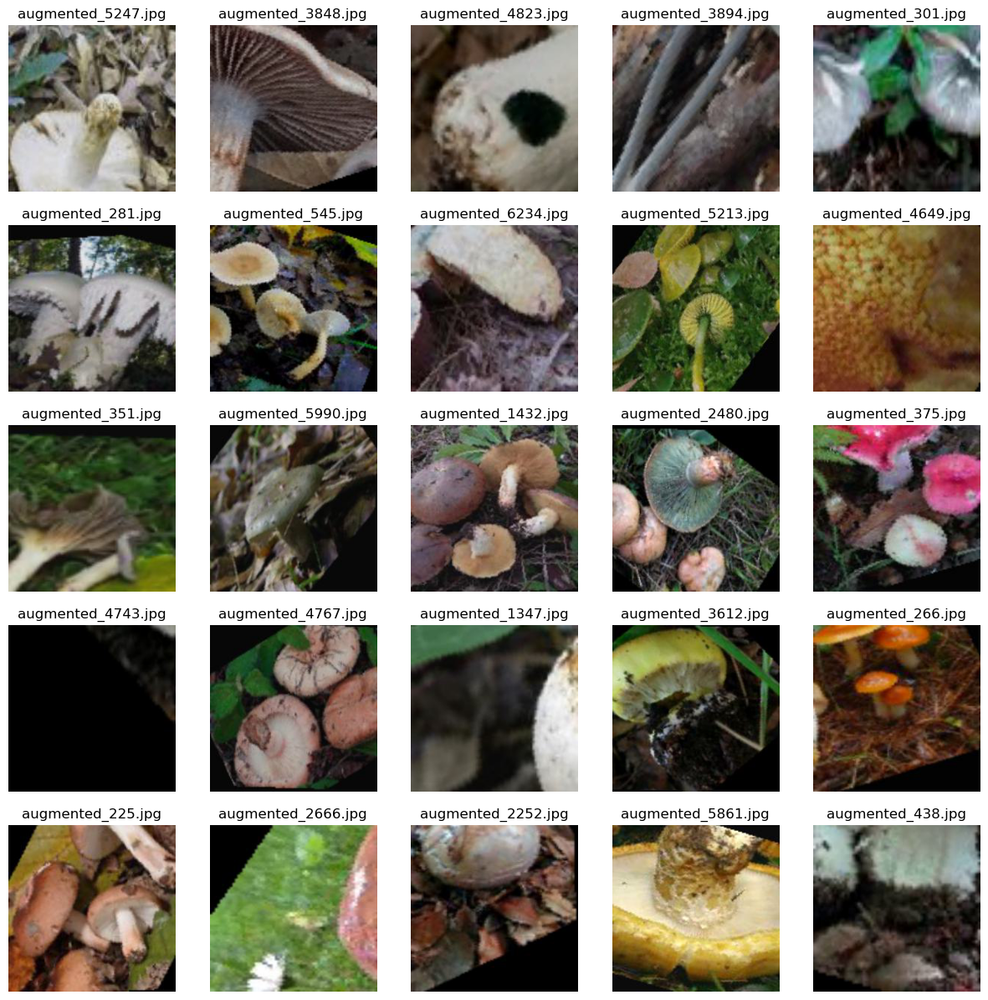

In [168]:
def display_images(image_paths, columns=5, rows=5, width=15, height=15):
    fig = plt.figure(figsize=(width, height))
    for i, image_path in enumerate(image_paths[:columns * rows]):
        img = Image.open(image_path)
        fig.add_subplot(rows, columns, i + 1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(os.path.basename(image_path))
    plt.show()

augmented_dir = os.path.join(image_dir, 'augmented')

train_image_paths = []
for root, _, files in os.walk(os.path.join(augmented_dir, 'train')):
    for file in files:
        if file.endswith((".png", ".jpg", ".jpeg")):
            train_image_paths.append(os.path.join(root, file))

random.shuffle(train_image_paths)
display_images(train_image_paths, columns=5, rows=5, width=15, height=15)

Here's a sample of what some of the pictures look after augmentation (without normalization).

In [229]:
normalize_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

image_dir = r"C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\resized\augmented\train"

def normalize_and_save_image(image_path, output_path, transform):
    with Image.open(image_path) as img:
        normalized_img = transform(img)
        normalized_img_pil = transforms.ToPILImage()(normalized_img)
        normalized_img_pil.save(output_path)

for root, _, files in os.walk(image_dir):
    for file in files:
        if file.endswith((".png", ".jpg", ".jpeg")):
            image_path = os.path.join(root, file)
            output_path = image_path  
            normalize_and_save_image(image_path, output_path, normalize_transform)

print("All images have been normalized and saved.")

All images have been normalized and saved.


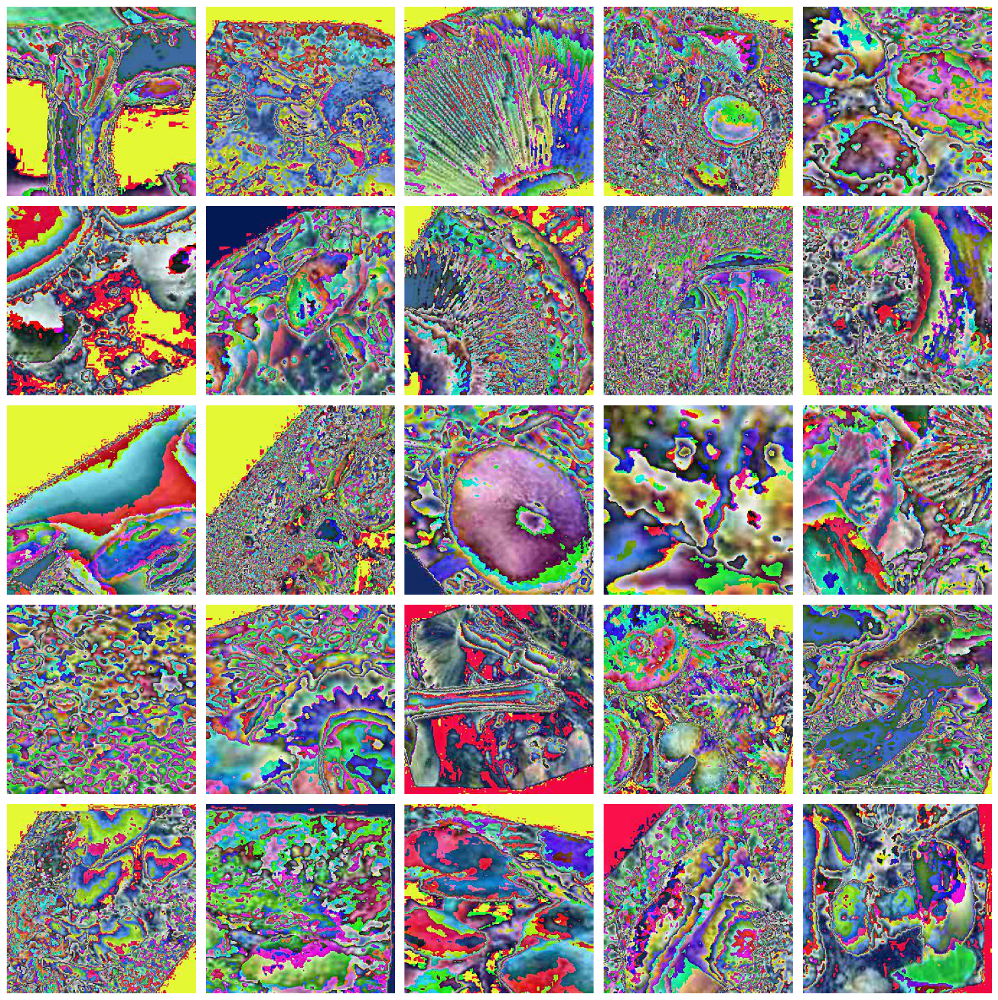

In [171]:
normalized_dir = r"C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\resized\augmented\train"

image_dir = r"C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\resized\augmented\train"

dataset = datasets.ImageFolder(root=image_dir, transform=transforms.ToTensor())
loader = DataLoader(dataset, batch_size=25, shuffle=True, num_workers=2)

def show_images(loader):
    dataiter = iter(loader)
    images, labels = next(dataiter)

    fig, axs = plt.subplots(5, 5, figsize=(15, 15))
    axs = axs.flatten()
    
    for img, ax in zip(images, axs):
        img = img.permute(1, 2, 0).numpy()
        ax.imshow(img)
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

show_images(loader)

And here's a sample of what some of them look like after normalization. 

# Modeling

4 models (2 architectures with either all or just a few trainable layers) were developed. The models were trained using transfer learning: the ResNet-18 model pre-trained on the ImageNet dataset was used as the starting point. The pre-processing parameters that were used to pre-train the ResNet-18 model were also used


I want to create a total of 4 models (2 architectures with either all or just a few trainable layers). The models trained using transfer learning: the ResNet-18 model pre-trained on the ImageNet dataset. The pre-processing parameters that were used to pre-train the ResNet-18 model should also used.

steps that are common to training all the models. During the training:

Model architectures prepared:
required layers replaced/added to the pre-trained model;
The required parts of the model either frozen (i.e., made not trainable) or unfrozen;
Hyperparameters selected:
first, batch size selected to fit the GPU memory;
learning rate selected using a learning rate finder;
max number of 400 epochs set;
early stopping used:
if the validation loss does not decrease for 3 epochs, the training should be stopped (i.e., patience is 3);
7 best versions of each model’s weights saved (7 checkpoints).
The model trained and performance metrics tracked:
model performance metrics calculated on the training and validation sets at the end of each epoch;
cross-entropy loss (the average of the loss function values per batch);
balanced accuracy (the macro average of correctly classified percentages of instances per class);
balanced accuracy @Top 2 (the same as balanced accuracy, but “correct” is considered when the true class is in the top 2 predicted classes; so this metric is always better than the previous one);
Code profiling information also tracked.
The performance of the models was compared.


for the first model, I want :
base model: ResNet-18 (pre-trained on the ImageNet dataset)
replaced layers: the last layer only
tuned layers: the last (replaced) layer only (classifier)
batch size: 256
use tuner.lr_find to find the best learning rate

for model 2: 

base model: ResNet-18 (pre-trained on the ImageNet dataset)
replaced layers: the last layer with 3 new layers
tuned layers: the replaced layers only (classifier)
batch size: 256
use tuner.lr_find to find the best learning rate

model3: 

base model: model 1 that is based on ResNet-18 (pre-trained on the ImageNet dataset)
replaced layers: the same as model 1 (ResNet-18 with output layer replaced)
tuned layers: all layers
batch size: 128
use tuner.lr_find to find the best learning rate

model 4: 

base model: model 2 that is based on ResNet-18 (pre-trained on the ImageNet dataset)
replaced layers: the same as model 2 (ResNet-18 without output + 3 layers)
tuned layers: all layers
batch size: 128
use tuner.lr_find to find the best learning rate

give me the code for each model so it's more structured and easy to follow along both for me and for my notebook. my images are already augmetned and ready to go in this folder: C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\resized\augmented

## Prepare Data Loaders

In [176]:
preprocess_transforms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

train_dir = r"C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\resized\augmented\train"
val_dir = r"C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\resized\augmented\val"
test_dir = r"C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\resized\augmented\test"

train_dataset = datasets.ImageFolder(root=train_dir, transform=preprocess_transforms)
val_dataset = datasets.ImageFolder(root=val_dir, transform=preprocess_transforms)
test_dataset = datasets.ImageFolder(root=test_dir, transform=preprocess_transforms)

batch_size = 128 
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

Here I've set up the preprocessing transformations. Namely: 

- **Resize(256)**: Resizes each image to have a shorter side of 256 pixels while maintaining the aspect ratio.
- **CenterCrop(224)**: Crops the central part of the image to 224x224 pixels.
- **ToTensor()**: Converts the image to a PyTorch tensor, which is the format required for model training and evaluation.
- **Normalize(mean, std)**: Normalizes the image using the specified mean and standard deviation values, which are typically those used for a model trained on ImageNet data. This ensures that the input to the model has a consistent distribution.

Then it creates the dataset with those tranformations having taken place and each one is loaded into a mini batches for training, validation and evaluation. 

## Define the Models

In [179]:
model = models.resnet18(pretrained=True)

for name, param in model.named_parameters():
    print(name)

conv1.weight
bn1.weight
bn1.bias
layer1.0.conv1.weight
layer1.0.bn1.weight
layer1.0.bn1.bias
layer1.0.conv2.weight
layer1.0.bn2.weight
layer1.0.bn2.bias
layer1.1.conv1.weight
layer1.1.bn1.weight
layer1.1.bn1.bias
layer1.1.conv2.weight
layer1.1.bn2.weight
layer1.1.bn2.bias
layer2.0.conv1.weight
layer2.0.bn1.weight
layer2.0.bn1.bias
layer2.0.conv2.weight
layer2.0.bn2.weight
layer2.0.bn2.bias
layer2.0.downsample.0.weight
layer2.0.downsample.1.weight
layer2.0.downsample.1.bias
layer2.1.conv1.weight
layer2.1.bn1.weight
layer2.1.bn1.bias
layer2.1.conv2.weight
layer2.1.bn2.weight
layer2.1.bn2.bias
layer3.0.conv1.weight
layer3.0.bn1.weight
layer3.0.bn1.bias
layer3.0.conv2.weight
layer3.0.bn2.weight
layer3.0.bn2.bias
layer3.0.downsample.0.weight
layer3.0.downsample.1.weight
layer3.0.downsample.1.bias
layer3.1.conv1.weight
layer3.1.bn1.weight
layer3.1.bn1.bias
layer3.1.conv2.weight
layer3.1.bn2.weight
layer3.1.bn2.bias
layer4.0.conv1.weight
layer4.0.bn1.weight
layer4.0.bn1.bias
layer4.0.conv2.we

Loading the pre-trained model (ResNet-18 and using the weights that have been pre-trained on ImageNet, so that the model has already learned to recognize a wide variety of features in images which can be useful for transfer learning). The loop then outputs a list of the model's parameters including the weights and biases of each layer. This is just to understand the structure and parameters of the model. 

In [198]:
def create_model1():
    model = models.resnet18(weights=ResNet18_Weights.IMAGENET1K_V1)
    return model

def create_model2():
    model = models.resnet18(weights=ResNet18_Weights.IMAGENET1K_V1)
    return model

In [201]:
class ResNetModule(pl.LightningModule):
    def __init__(self, model, num_classes, learning_rate=0.001):
        super(ResNetModule, self).__init__()
        self.model = model
        self.num_classes = num_classes
        self.learning_rate = learning_rate
        self.criterion = nn.CrossEntropyLoss()
        self.accuracy = Accuracy(task="multiclass", num_classes=num_classes)

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        inputs, labels = batch
        outputs = self(inputs)
        loss = self.criterion(outputs, labels)
        acc = self.accuracy(outputs, labels)
        self.log('train_loss', loss)
        self.log('train_acc', acc, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        return loss

    def validation_step(self, batch, batch_idx):
        inputs, labels = batch
        outputs = self(inputs)
        loss = self.criterion(outputs, labels)
        acc = self.accuracy(outputs, labels)
        self.log('val_loss', loss, prog_bar=True)
        self.log('val_acc', acc, prog_bar=True)
        return loss

    def configure_optimizers(self):
        optimizer = optim.Adam(self.parameters(), lr=self.learning_rate)
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=3, verbose=True)
        return {'optimizer': optimizer, 'lr_scheduler': scheduler, 'monitor': 'val_loss'}

model1 = create_model1()
model2 = create_model2()
model3 = create_model_with_trainable_layers(create_model1(), [name for name, _ in model1.named_parameters()])
model4 = create_model_with_trainable_layers(create_model2(), [name for name, _ in model2.named_parameters()])

resnet1 = ResNetModule(model1, num_classes=9)
resnet2 = ResNetModule(model2, num_classes=9)
resnet3 = ResNetModule(model3, num_classes=9)
resnet4 = ResNetModule(model4, num_classes=9)

This is a deep learning model training pipeline. I created a base class which initializes with the number of classes and the learning rate. Then the loss criterion is set up and accuracy is specified as the accuracy metric. Forward defines the forward pass of the model and training step handles the logic for a single training step. Specifically, it received a batch of data, passes the inputs through the model to get ouputs, calculates the loss, computes the accuracy, logs the loss and accuracy, and then returns the loss for optimization. The validation step is similar to the training step except it works on the validation set. The configure optimizers sets up Adam as the optimizer and learning rate scheduler to adjust the learning rate based on validation loss. 

In [184]:
def create_model1():
    model = models.resnet18(pretrained=True)
    num_classes = 9
    model.fc = nn.Linear(model.fc.in_features, num_classes)
    return model

def create_model2():
    model = models.resnet18(pretrained=True)
    num_classes = 9
    model.fc = nn.Sequential(
        nn.Linear(model.fc.in_features, 512),
        nn.ReLU(),
        nn.Dropout(0.5),
        nn.Linear(512, 256),
        nn.ReLU(),
        nn.Dropout(0.5),
        nn.Linear(256, num_classes)
    )
    return model

def create_model_with_trainable_layers(base_model, trainable_layers):
    for param in base_model.parameters():
        param.requires_grad = False
    for name, param in base_model.named_parameters():
        if any(layer in name for layer in trainable_layers):
            param.requires_grad = True
    return base_model

model1 = create_model1()
model2 = create_model2()

model3 = create_model_with_trainable_layers(create_model1(), [name for name, _ in model1.named_parameters()])

model4 = create_model_with_trainable_layers(create_model2(), [name for name, _ in model2.named_parameters()])

I've set up 4 models. The base model for each of them is a ResNet-18 model pre-trained on ImageNet. 

- **Model 1** - The last layer is modified, replaced with a with a new `nn.Linear` layer that outputs `num_classes` (9) classes.

- **Model 2** - The last layer is replaced with a `nn.Sequential` block that includes:
     - A linear layer reducing dimensions from `model.fc.in_features` to 512 units.
     - A ReLU activation function.
     - A dropout layer with a 50% dropout rate for regularization.
     - A second linear layer reducing dimensions to 256 units.
     - Another ReLU activation.
     - Another dropout layer.
     - A final linear layer mapping to the 9 output classes.

- **Models 3 & 4**- These are models 1 and 2 respectivealy, where all the layers in the base model have their gradients disabled by setting `param.requires_grad = False`. This effectively freezes these layers, meaning they won't be updated during training.The function then selectively re-enables training (`param.requires_grad = True`) for layers specified in the `trainable_layers` list. This is a common strategy in transfer learning where only certain layers are fine-tuned.This function returns a model that is partially frozen, with specific layers left trainable, balancing the benefits of transfer learning (retaining knowledge from the pre-trained model) with the flexibility to adapt to new data.

In [185]:
class EarlyStopping:
    def __init__(self, patience=3, verbose=False):
        self.patience = patience
        self.verbose = verbose
        self.counter = 0
        self.best_score = None
        self.early_stop = False

    def __call__(self, val_loss, model, checkpoint_path):
        score = -val_loss
        if self.best_score is None:
            self.best_score = score
            self.save_checkpoint(val_loss, model, checkpoint_path)
        elif score < self.best_score:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.save_checkpoint(val_loss, model, checkpoint_path)
            self.counter = 0

    def save_checkpoint(self, val_loss, model, checkpoint_path):
        if self.verbose:
            print(f'Saving model ... Validation loss: {val_loss}')
        torch.save(model.state_dict(), checkpoint_path)

def train_model(model, train_loader, val_loader, criterion, optimizer, scheduler, num_epochs=400, checkpoint_dir='checkpoints'):
    writer = SummaryWriter()
    best_val_loss = float('inf')
    early_stopping = EarlyStopping(patience=3, verbose=True)
    
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0
        top2_correct = 0
        
        for inputs, labels in tqdm(train_loader):
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            correct += torch.sum(preds == labels.data)
            total += labels.size(0)
            

            top2_preds = torch.topk(outputs, 2, dim=1).indices
            top2_correct += torch.sum((top2_preds == labels.unsqueeze(1)).any(dim=1))
        
        epoch_loss = running_loss / total
        epoch_acc = correct.double() / total
        epoch_top2_acc = top2_correct.double() / total

        writer.add_scalar('Loss/train', epoch_loss, epoch)
        writer.add_scalar('Accuracy/train', epoch_acc, epoch)
        writer.add_scalar('Top2Accuracy/train', epoch_top2_acc, epoch)
        
        model.eval()
        val_loss = 0.0
        val_correct = 0
        val_total = 0
        val_top2_correct = 0
        
        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                
                val_loss += loss.item() * inputs.size(0)
                _, preds = torch.max(outputs, 1)
                val_correct += torch.sum(preds == labels.data)
                val_total += labels.size(0)
                
                top2_preds = torch.topk(outputs, 2, dim=1).indices
                val_top2_correct += torch.sum((top2_preds == labels.unsqueeze(1)).any(dim=1))
        
        val_loss /= val_total
        val_acc = val_correct.double() / val_total
        val_top2_acc = val_top2_correct.double() / val_total
        
        writer.add_scalar('Loss/val', val_loss, epoch)
        writer.add_scalar('Accuracy/val', val_acc, epoch)
        writer.add_scalar('Top2Accuracy/val', val_top2_acc, epoch)
        
        print(f'Epoch {epoch+1}/{num_epochs} 
              - Loss: {epoch_loss:.4f} 
              - Acc: {epoch_acc:.4f} 
              - Top2Acc: {epoch_top2_acc:.4f} 
              - Val Loss: {val_loss:.4f} 
              - Val Acc: {val_acc:.4f} 
              - Val Top2Acc: {val_top2_acc:.4f}')
        
        scheduler.step(val_loss)
        
        checkpoint_path = os.path.join(checkpoint_dir, f'checkpoint_epoch_{epoch+1}.pt')
        early_stopping(val_loss, model, checkpoint_path)
        if early_stopping.early_stop:
            print("Early stopping")
            break
    
    writer.close()

This is a training loop that includes early stopping, logging, and saving model checkpoints. 

**EarlyStopping Class**

Monitors the validation loss during training and stops the training process if loss doesn't improve after a specified number of epochs.

- **__init__**:
  - patience: Number of epochs with no improvement after which training will be stopped.
  - verbose: If True, will print out a message every time the model improves.
  - counter: Tracks how many epochs have passed without improvement.
  - best_score: Keeps track of the best validation loss score seen so far.
  - early_stop: A flag that indicates whether early stopping should occur.

- **__call__**:
  - Called at the end of each epoch with the current validation loss.
  - If the current validation loss is better (lower) than best_score, it updates best_score, resets the counter, and saves the model checkpoint.
  - If the validation loss does not improve, the counter is incremented.
  - If the counter exceeds patience, early_stop`is set to True, signaling that training should stop.

**train_model Function**

Responsible for the main training loop of the model. 

**Epoch Loop**:
  - **Training Phase**:
    - The model is set to training mode with model.train().
    - For each batch, the model makes predictions, calculates the loss, and updates the model weights using backpropagation.
    - The accuracy and top-2 accuracy (how often the correct label is within the top 2 predictions) are calculated for the training set.
    - Metrics such as loss, accuracy, and top-2 accuracy are logged.

  - **Validation Phase**:
    - The model is set to evaluation mode with model.eval().
    - In a similar loop, the model processes the validation set but without updating weights.
    - Validation loss, accuracy, and top-2 accuracy are calculated and logged.

  - **Logging and Printing**:
    - The function logs the loss and accuracy for both the training and validation sets after each epoch.
    - It prints the progress of training, including the loss and accuracy metrics.

  - **Learning Rate Scheduler**:
    - The learning rate scheduler is updated based on the validation loss using scheduler.step(val_loss). This can reduce the learning rate if the validation loss plateaus.

  - **Checkpointing and Early Stopping**:
    - The model's state is saved after each epoch, and the EarlyStopping instance checks whether training should be stopped early.
    - If the early stopping condition is met, the loop breaks out of training early.

In [186]:
device = torch.device("cpu")
print(f"Using device: {device}")

os.makedirs('checkpoints/model1', exist_ok=True)
os.makedirs('checkpoints/model2', exist_ok=True)
os.makedirs('checkpoints/model3', exist_ok=True)
os.makedirs('checkpoints/model4', exist_ok=True)

criterion = nn.CrossEntropyLoss()

model1 = create_model1().to(device)
optimizer1 = optim.Adam(model1.parameters(), lr=0.022387)
scheduler1 = ReduceLROnPlateau(optimizer1, mode='min', patience=3, verbose=True)
train_model(model1, train_loader, val_loader, criterion, optimizer1, scheduler1, checkpoint_dir='checkpoints/model1')

model2 = create_model2().to(device)
optimizer2 = optim.Adam(model2.parameters(), lr=0.003981)
scheduler2 = ReduceLROnPlateau(optimizer2, mode='min', patience=3, verbose=True)
train_model(model2, train_loader, val_loader, criterion, optimizer2, scheduler2, checkpoint_dir='checkpoints/model2')

model3 = create_model_with_trainable_layers(create_model1(), [name for name, _ in model1.named_parameters()]).to(device)
optimizer3 = optim.Adam(model3.parameters(), lr=0.000079)
scheduler3 = ReduceLROnPlateau(optimizer3, mode='min', patience=3, verbose=True)
train_model(model3, train_loader, val_loader, criterion, optimizer3, scheduler3, checkpoint_dir='checkpoints/model3')

model4 = create_model_with_trainable_layers(create_model2(), [name for name, _ in model2.named_parameters()]).to(device)
optimizer4 = optim.Adam(model4.parameters(), lr=0.000079)
scheduler4 = ReduceLROnPlateau(optimizer4, mode='min', patience=3, verbose=True)
train_model(model4, train_loader, val_loader, criterion, optimizer4, scheduler4, checkpoint_dir='checkpoints/model4')

Using device: cpu


  0%|          | 0/125 [00:00<?, ?it/s]

100%|██████████| 125/125 [01:07<00:00,  1.85it/s]


Epoch 1/400 - Loss: 2.6656 - Acc: 0.1925 - Top2Acc: 0.3533 - Val Loss: 2.0625 - Val Acc: 0.2276 - Val Top2Acc: 0.3994
Saving model ... Validation loss: 2.06254646072014


100%|██████████| 125/125 [01:06<00:00,  1.88it/s]


Epoch 2/400 - Loss: 2.0585 - Acc: 0.2181 - Top2Acc: 0.3932 - Val Loss: 2.0447 - Val Acc: 0.2268 - Val Top2Acc: 0.3964
Saving model ... Validation loss: 2.0447335577406376


100%|██████████| 125/125 [01:06<00:00,  1.89it/s]


Epoch 3/400 - Loss: 2.0518 - Acc: 0.2221 - Top2Acc: 0.3955 - Val Loss: 2.0461 - Val Acc: 0.2268 - Val Top2Acc: 0.3873


100%|██████████| 125/125 [01:05<00:00,  1.90it/s]


Epoch 4/400 - Loss: 2.0515 - Acc: 0.2264 - Top2Acc: 0.3957 - Val Loss: 2.0441 - Val Acc: 0.2268 - Val Top2Acc: 0.3986
Saving model ... Validation loss: 2.044062289782009


100%|██████████| 125/125 [01:06<00:00,  1.87it/s]


Epoch 5/400 - Loss: 2.0463 - Acc: 0.2254 - Top2Acc: 0.3960 - Val Loss: 2.0484 - Val Acc: 0.2268 - Val Top2Acc: 0.3986


100%|██████████| 125/125 [01:06<00:00,  1.88it/s]


Epoch 6/400 - Loss: 2.0446 - Acc: 0.2244 - Top2Acc: 0.3962 - Val Loss: 2.0423 - Val Acc: 0.2268 - Val Top2Acc: 0.3888
Saving model ... Validation loss: 2.0422618599340443


100%|██████████| 125/125 [01:07<00:00,  1.85it/s]


Epoch 7/400 - Loss: 2.0440 - Acc: 0.2261 - Top2Acc: 0.3902 - Val Loss: 2.0412 - Val Acc: 0.2261 - Val Top2Acc: 0.3986
Saving model ... Validation loss: 2.041233442740595


100%|██████████| 125/125 [01:08<00:00,  1.83it/s]


Epoch 8/400 - Loss: 2.0453 - Acc: 0.2256 - Top2Acc: 0.4000 - Val Loss: 2.0384 - Val Acc: 0.2321 - Val Top2Acc: 0.3994
Saving model ... Validation loss: 2.0383887077150438


100%|██████████| 125/125 [01:06<00:00,  1.87it/s]


Epoch 9/400 - Loss: 2.0349 - Acc: 0.2266 - Top2Acc: 0.4025 - Val Loss: 2.0081 - Val Acc: 0.2276 - Val Top2Acc: 0.4039
Saving model ... Validation loss: 2.0081113464596942


100%|██████████| 125/125 [01:06<00:00,  1.88it/s]


Epoch 10/400 - Loss: 2.0113 - Acc: 0.2219 - Top2Acc: 0.4153 - Val Loss: 1.9946 - Val Acc: 0.2321 - Val Top2Acc: 0.4115
Saving model ... Validation loss: 1.9945734822848908


100%|██████████| 125/125 [01:04<00:00,  1.93it/s]


Epoch 11/400 - Loss: 2.0009 - Acc: 0.2314 - Top2Acc: 0.4186 - Val Loss: 2.0688 - Val Acc: 0.2110 - Val Top2Acc: 0.3896


100%|██████████| 125/125 [01:03<00:00,  1.96it/s]


Epoch 12/400 - Loss: 1.9956 - Acc: 0.2236 - Top2Acc: 0.4266 - Val Loss: 2.0106 - Val Acc: 0.2336 - Val Top2Acc: 0.4190


100%|██████████| 125/125 [01:08<00:00,  1.83it/s]


Epoch 13/400 - Loss: 1.9952 - Acc: 0.2289 - Top2Acc: 0.4221 - Val Loss: 2.0508 - Val Acc: 0.2095 - Val Top2Acc: 0.3843
Early stopping


100%|██████████| 125/125 [01:09<00:00,  1.79it/s]


Epoch 1/400 - Loss: 2.1358 - Acc: 0.2043 - Top2Acc: 0.3776 - Val Loss: 2.0512 - Val Acc: 0.1620 - Val Top2Acc: 0.3873
Saving model ... Validation loss: 2.0511608853228753


100%|██████████| 125/125 [01:10<00:00,  1.78it/s]


Epoch 2/400 - Loss: 2.0609 - Acc: 0.2201 - Top2Acc: 0.3927 - Val Loss: 2.0447 - Val Acc: 0.2268 - Val Top2Acc: 0.3873
Saving model ... Validation loss: 2.0447087354379754


100%|██████████| 125/125 [01:10<00:00,  1.77it/s]


Epoch 3/400 - Loss: 2.0485 - Acc: 0.2249 - Top2Acc: 0.3910 - Val Loss: 2.0441 - Val Acc: 0.2268 - Val Top2Acc: 0.3986
Saving model ... Validation loss: 2.0440730090956984


100%|██████████| 125/125 [01:09<00:00,  1.81it/s]


Epoch 4/400 - Loss: 2.0472 - Acc: 0.2271 - Top2Acc: 0.3947 - Val Loss: 2.0444 - Val Acc: 0.2268 - Val Top2Acc: 0.3873


100%|██████████| 125/125 [01:12<00:00,  1.73it/s]


Epoch 5/400 - Loss: 2.0492 - Acc: 0.2264 - Top2Acc: 0.3917 - Val Loss: 2.0444 - Val Acc: 0.2268 - Val Top2Acc: 0.3873


100%|██████████| 125/125 [01:12<00:00,  1.72it/s]


Epoch 6/400 - Loss: 2.0487 - Acc: 0.2264 - Top2Acc: 0.3940 - Val Loss: 2.0469 - Val Acc: 0.2268 - Val Top2Acc: 0.3986
Early stopping


100%|██████████| 125/125 [01:11<00:00,  1.74it/s]


Epoch 1/400 - Loss: 1.9499 - Acc: 0.2859 - Top2Acc: 0.4714 - Val Loss: 1.7933 - Val Acc: 0.3474 - Val Top2Acc: 0.5524
Saving model ... Validation loss: 1.7932753354513116


100%|██████████| 125/125 [01:13<00:00,  1.71it/s]


Epoch 2/400 - Loss: 1.0856 - Acc: 0.6776 - Top2Acc: 0.8359 - Val Loss: 1.8579 - Val Acc: 0.3504 - Val Top2Acc: 0.5426


100%|██████████| 125/125 [01:13<00:00,  1.71it/s]


Epoch 3/400 - Loss: 0.3468 - Acc: 0.9628 - Top2Acc: 0.9884 - Val Loss: 1.9421 - Val Acc: 0.3504 - Val Top2Acc: 0.5433


100%|██████████| 125/125 [01:11<00:00,  1.74it/s]


Epoch 4/400 - Loss: 0.0810 - Acc: 0.9992 - Top2Acc: 1.0000 - Val Loss: 1.9736 - Val Acc: 0.3760 - Val Top2Acc: 0.5561
Early stopping


100%|██████████| 125/125 [01:10<00:00,  1.76it/s]


Epoch 1/400 - Loss: 2.0714 - Acc: 0.2133 - Top2Acc: 0.3935 - Val Loss: 1.9763 - Val Acc: 0.2683 - Val Top2Acc: 0.4725
Saving model ... Validation loss: 1.9762800569900822


100%|██████████| 125/125 [01:10<00:00,  1.77it/s]


Epoch 2/400 - Loss: 1.8765 - Acc: 0.3045 - Top2Acc: 0.4977 - Val Loss: 1.8180 - Val Acc: 0.3353 - Val Top2Acc: 0.5252
Saving model ... Validation loss: 1.8179997443793496


100%|██████████| 125/125 [01:10<00:00,  1.79it/s]


Epoch 3/400 - Loss: 1.5008 - Acc: 0.4525 - Top2Acc: 0.6410 - Val Loss: 1.8171 - Val Acc: 0.3414 - Val Top2Acc: 0.5463
Saving model ... Validation loss: 1.8170705028467817


100%|██████████| 125/125 [01:08<00:00,  1.83it/s]


Epoch 4/400 - Loss: 0.9428 - Acc: 0.6827 - Top2Acc: 0.8201 - Val Loss: 2.1484 - Val Acc: 0.3331 - Val Top2Acc: 0.5237


100%|██████████| 125/125 [01:09<00:00,  1.81it/s]


Epoch 5/400 - Loss: 0.4834 - Acc: 0.8495 - Top2Acc: 0.9349 - Val Loss: 2.2447 - Val Acc: 0.3519 - Val Top2Acc: 0.5569


100%|██████████| 125/125 [01:09<00:00,  1.79it/s]


Epoch 6/400 - Loss: 0.2578 - Acc: 0.9244 - Top2Acc: 0.9794 - Val Loss: 2.4328 - Val Acc: 0.3346 - Val Top2Acc: 0.5328
Early stopping


In [190]:
model1_checkpoints = os.listdir('checkpoints/model1')
model2_checkpoints = os.listdir('checkpoints/model2')
model3_checkpoints = os.listdir('checkpoints/model3')
model4_checkpoints = os.listdir('checkpoints/model4')

print("Model 1 checkpoints:", model1_checkpoints)
print("Model 2 checkpoints:", model2_checkpoints)
print("Model 3 checkpoints:", model3_checkpoints)
print("Model 4 checkpoints:", model4_checkpoints)

Model 1 checkpoints: ['checkpoint_epoch_1.pt', 'checkpoint_epoch_10.pt', 'checkpoint_epoch_2.pt', 'checkpoint_epoch_4.pt', 'checkpoint_epoch_6.pt', 'checkpoint_epoch_7.pt', 'checkpoint_epoch_8.pt', 'checkpoint_epoch_9.pt']
Model 2 checkpoints: ['checkpoint_epoch_1.pt', 'checkpoint_epoch_2.pt', 'checkpoint_epoch_3.pt']
Model 3 checkpoints: ['checkpoint_epoch_1.pt']
Model 4 checkpoints: ['checkpoint_epoch_1.pt', 'checkpoint_epoch_2.pt', 'checkpoint_epoch_3.pt']


The checkpoints indicate when each model’s validation performance was best during training. The more checkpoints, the more often the model improved and was saved.

In [191]:
def evaluate_model(model, loader):
    model.eval()
    correct = 0
    total = 0
    top2_correct = 0

    with torch.no_grad():
        for inputs, labels in loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            correct += torch.sum(preds == labels.data)
            total += labels.size(0)

            top2_preds = torch.topk(outputs, 2, dim=1).indices
            top2_correct += torch.sum((top2_preds == labels.unsqueeze(1)).any(dim=1))

    acc = correct.double() / total
    top2_acc = top2_correct.double() / total

    return acc.item(), top2_acc.item()

best_model1 = create_model1().to(device)
best_model2 = create_model2().to(device)
best_model3 = create_model1().to(device)  
best_model4 = create_model2().to(device)  


best_model1.load_state_dict(torch.load('checkpoints/model1/checkpoint_epoch_10.pt'))  
best_model2.load_state_dict(torch.load('checkpoints/model2/checkpoint_epoch_3.pt'))  
best_model3.load_state_dict(torch.load('checkpoints/model3/checkpoint_epoch_1.pt'))  
best_model4.load_state_dict(torch.load('checkpoints/model4/checkpoint_epoch_3.pt')) 


acc1, top2_acc1 = evaluate_model(best_model1, test_loader)
acc2, top2_acc2 = evaluate_model(best_model2, test_loader)
acc3, top2_acc3 = evaluate_model(best_model3, test_loader)
acc4, top2_acc4 = evaluate_model(best_model4, test_loader)

print(f"Model 1 - Accuracy: {acc1:.4f}, Top-2 Accuracy: {top2_acc1:.4f}")
print(f"Model 2 - Accuracy: {acc2:.4f}, Top-2 Accuracy: {top2_acc2:.4f}")
print(f"Model 3 - Accuracy: {acc3:.4f}, Top-2 Accuracy: {top2_acc3:.4f}")
print(f"Model 4 - Accuracy: {acc4:.4f}, Top-2 Accuracy: {top2_acc4:.4f}")

Model 1 - Accuracy: 0.2344, Top-2 Accuracy: 0.4115
Model 2 - Accuracy: 0.2261, Top-2 Accuracy: 0.3986
Model 3 - Accuracy: 0.3293, Top-2 Accuracy: 0.5365
Model 4 - Accuracy: 0.3369, Top-2 Accuracy: 0.5456


**Model 1**:
  - This model performs relatively poorly, with only about 23.44% of the predictions being correct and 41.15% of the correct labels appearing in the top two predictions.

**Model 2**:
  - This model performs slightly worse than Model 1 in terms of accuracy and top-2 accuracy, indicating it may not have learned as effectively from the data.

**Model 3**:
  - This model performs better than both Model 1 and Model 2, showing an improvement in both accuracy and top-2 accuracy. This suggests that the model might be more effective at generalizing to new data.

**Model 4**:
  - This model has the best performance among the four, with the highest accuracy and top-2 accuracy. It seems that whatever adjustments or fine-tuning were made to this model during training paid off.

> Overall Insights

- Models 3 and 4 outperform Models 1 and 2, suggesting that the changes in the model architecture used for Models 3 and 4 were beneficial.
  
- The top-2 accuracy is significantly higher than the standard accuracy across all models, which suggests that while the models might struggle to pinpoint the exact correct label, they often include it among the top two predictions. This is valuable in scenarios where the exact match is not critical, and having the correct label within the top two predictions is sufficient.

- Loading the best checkpoints ensures that each model is evaluated at its peak performance, providing a fair comparison of their abilities.

## Create and Modify Models

In [177]:
model = models.resnet18(pretrained=True)

for name, param in model.named_parameters():
    print(name)

conv1.weight
bn1.weight
bn1.bias
layer1.0.conv1.weight
layer1.0.bn1.weight
layer1.0.bn1.bias
layer1.0.conv2.weight
layer1.0.bn2.weight
layer1.0.bn2.bias
layer1.1.conv1.weight
layer1.1.bn1.weight
layer1.1.bn1.bias
layer1.1.conv2.weight
layer1.1.bn2.weight
layer1.1.bn2.bias
layer2.0.conv1.weight
layer2.0.bn1.weight
layer2.0.bn1.bias
layer2.0.conv2.weight
layer2.0.bn2.weight
layer2.0.bn2.bias
layer2.0.downsample.0.weight
layer2.0.downsample.1.weight
layer2.0.downsample.1.bias
layer2.1.conv1.weight
layer2.1.bn1.weight
layer2.1.bn1.bias
layer2.1.conv2.weight
layer2.1.bn2.weight
layer2.1.bn2.bias
layer3.0.conv1.weight
layer3.0.bn1.weight
layer3.0.bn1.bias
layer3.0.conv2.weight
layer3.0.bn2.weight
layer3.0.bn2.bias
layer3.0.downsample.0.weight
layer3.0.downsample.1.weight
layer3.0.downsample.1.bias
layer3.1.conv1.weight
layer3.1.bn1.weight
layer3.1.bn1.bias
layer3.1.conv2.weight
layer3.1.bn2.weight
layer3.1.bn2.bias
layer4.0.conv1.weight
layer4.0.bn1.weight
layer4.0.bn1.bias
layer4.0.conv2.we

c:\Users\Liberty\anaconda3\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\Liberty\anaconda3\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


# Starting over - modeling

## Common Setup

In [4]:
data_dir = r'C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\resized\augmented'
batch_size = 128  
num_workers = 8  
max_epochs = 400
patience = 5  

transform = transforms.Compose([
    transforms.ToTensor()  
])

train_dataset = datasets.ImageFolder(os.path.join(data_dir, 'train'), transform)
val_dataset = datasets.ImageFolder(os.path.join(data_dir, 'val'), transform)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers, persistent_workers=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers, persistent_workers=True)

## Model 1: ResNet-18 with Last Layer Replaced and Tuned

In [236]:
class ResNet18_Model1(LightningModule):
    def __init__(self, num_classes=10, learning_rate=0.001):
        super(ResNet18_Model1, self).__init__()
        self.save_hyperparameters()
        self.model = models.resnet18(weights=ResNet18_Weights.IMAGENET1K_V1)
        num_ftrs = self.model.fc.in_features
        self.model.fc = nn.Linear(num_ftrs, num_classes)
        self.criterion = nn.CrossEntropyLoss()

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = self.criterion(y_hat, y)
        self.log('train_loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = self.criterion(y_hat, y)
        self.log('val_loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        preds = torch.argmax(y_hat, dim=1)
        acc = accuracy_score(y.cpu(), preds.cpu())
        self.log('val_acc', acc, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        return loss

    def configure_optimizers(self):
        optimizer = optim.Adam(self.parameters(), lr=self.hparams.learning_rate)
        scheduler = StepLR(optimizer, step_size=7, gamma=0.1)
        return [optimizer], [scheduler]

model1 = ResNet18_Model1(num_classes=10, learning_rate=1e-4)

checkpoint_callback = ModelCheckpoint(monitor='val_loss', mode='min', save_top_k=7)
early_stopping_callback = EarlyStopping(monitor='val_loss', patience=patience, mode='min')

trainer = Trainer(max_epochs=max_epochs, callbacks=[early_stopping_callback, checkpoint_callback], log_every_n_steps=1)
trainer.fit(model1, train_dataloaders=train_loader, val_dataloaders=val_loader)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name      | Type             | Params | Mode 
-------------------------------------------------------
0 | model     | ResNet           | 11.2 M | train
1 | criterion | CrossEntropyLoss | 0      | train
-------------------------------------------------------
11.2 M    Trainable params
0         Non-trainable params
11.2 M    Total params
44.727    Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

The learning rate finder stopped early after 16 steps due to diverging loss. This indicates that the initial learning rates tried were too high, causing the loss to increase significantly.
The suggested learning rate was set to 1.5848931924611133e-07, which is extremely low.

The model completed epoch 4 with 16 batches. This indicates that the training process is progressing.

In [237]:
best_model_path = checkpoint_callback.best_model_path
model1 = ResNet18_Model1.load_from_checkpoint(best_model_path)

model1.eval()

val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)
all_preds = []
all_labels = []
for batch in val_loader:
    x, y = batch
    with torch.no_grad():
        y_hat = model1(x)
    preds = torch.argmax(y_hat, dim=1)
    all_preds.extend(preds.cpu().numpy())
    all_labels.extend(y.cpu().numpy())

accuracy = accuracy_score(all_labels, all_preds)
print(f'Validation Accuracy: {accuracy:.4f}')

Validation Accuracy: 0.3843


The original Model 1 had a validation accuracy of 0.2344. This is a significant improvement in validation accuracy.

## Model 2: ResNet-18 with Three New Layers Added and Tuned

In [238]:
class ResNet18_Model2(LightningModule):
    def __init__(self, num_classes=10, learning_rate=0.001):
        super(ResNet18_Model2, self).__init__()
        self.save_hyperparameters()
        self.model = models.resnet18(weights=ResNet18_Weights.IMAGENET1K_V1)
        num_ftrs = self.model.fc.in_features
        self.model.fc = nn.Sequential(
            nn.Linear(num_ftrs, 512),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(256, num_classes)
        )
        self.criterion = nn.CrossEntropyLoss()

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = self.criterion(y_hat, y)
        self.log('train_loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = self.criterion(y_hat, y)
        self.log('val_loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        preds = torch.argmax(y_hat, dim=1)
        acc = accuracy_score(y.cpu(), preds.cpu())
        self.log('val_acc', acc, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        return loss

    def configure_optimizers(self):
        optimizer = optim.Adam(self.parameters(), lr=self.hparams.learning_rate)
        scheduler = StepLR(optimizer, step_size=7, gamma=0.1)
        return [optimizer], [scheduler]

model2 = ResNet18_Model2(num_classes=10, learning_rate=1e-4)

checkpoint_callback = ModelCheckpoint(monitor='val_loss', mode='min', save_top_k=7)
early_stopping_callback = EarlyStopping(monitor='val_loss', patience=patience, mode='min')

trainer = Trainer(max_epochs=max_epochs, callbacks=[early_stopping_callback, checkpoint_callback], log_every_n_steps=1)
trainer.fit(model2, train_dataloaders=train_loader, val_dataloaders=val_loader)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name      | Type             | Params | Mode 
-------------------------------------------------------
0 | model     | ResNet           | 11.6 M | train
1 | criterion | CrossEntropyLoss | 0      | train
-------------------------------------------------------
11.6 M    Trainable params
0         Non-trainable params
11.6 M    Total params
46.292    Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

c:\Users\Liberty\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:419: Consider setting `persistent_workers=True` in 'val_dataloader' to speed up the dataloader worker initialization.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

In [239]:
best_model_path = checkpoint_callback.best_model_path
model2 = ResNet18_Model2.load_from_checkpoint(best_model_path)

model2.eval()

val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)
all_preds = []
all_labels = []
for batch in val_loader:
    x, y = batch
    with torch.no_grad():
        y_hat = model2(x)
    preds = torch.argmax(y_hat, dim=1)
    all_preds.extend(preds.cpu().numpy())
    all_labels.extend(y.cpu().numpy())

accuracy = accuracy_score(all_labels, all_preds)
print(f'Validation Accuracy: {accuracy:.4f}')

Validation Accuracy: 0.3723


In [240]:
class ResNet18_Model2(LightningModule):
    def __init__(self, num_classes=10, learning_rate=0.001):
        super(ResNet18_Model2, self).__init__()
        self.save_hyperparameters()
        self.model = models.resnet18(weights=ResNet18_Weights.IMAGENET1K_V1)
        num_ftrs = self.model.fc.in_features
        self.model.fc = nn.Sequential(
            nn.Linear(num_ftrs, 512),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, num_classes)
        )
        self.criterion = nn.CrossEntropyLoss()

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = self.criterion(y_hat, y)
        self.log('train_loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = self.criterion(y_hat, y)
        self.log('val_loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        preds = torch.argmax(y_hat, dim=1)
        acc = accuracy_score(y.cpu(), preds.cpu())
        self.log('val_acc', acc, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        return loss

    def configure_optimizers(self):
        optimizer = optim.Adam(self.parameters(), lr=self.hparams.learning_rate, weight_decay=1e-4)
        scheduler = StepLR(optimizer, step_size=7, gamma=0.1)
        return [optimizer], [scheduler]

model2 = ResNet18_Model2(num_classes=10)

checkpoint_callback = ModelCheckpoint(monitor='val_loss', mode='min', save_top_k=7)
early_stopping_callback = EarlyStopping(monitor='val_loss', patience=patience, mode='min')
trainer = Trainer(max_epochs=1)
tuner = Tuner(trainer)
lr_finder = tuner.lr_find(model2, train_dataloaders=train_loader, val_dataloaders=val_loader)
model2.hparams.learning_rate = lr_finder.suggestion()


trainer = Trainer(max_epochs=max_epochs, callbacks=[early_stopping_callback, checkpoint_callback], log_every_n_steps=1)
trainer.fit(model2, train_dataloaders=train_loader, val_dataloaders=val_loader)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
c:\Users\Liberty\anaconda3\Lib\site-packages\pytorch_lightning\loops\fit_loop.py:298: The number of training batches (32) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
c:\Users\Liberty\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:419: Consider setting `persistent_workers=True` in 'val_dataloader' to speed up the dataloader worker initialization.


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 32 steps due to diverging loss.
Learning rate set to 3.0199517204020163e-06
Restoring states from the checkpoint path at c:\Users\Liberty\Desktop\CodingProjects\mushrooms\.lr_find_0f9e21ae-89d4-4cd4-af9c-ef04066e67be.ckpt
Restored all states from the checkpoint at c:\Users\Liberty\Desktop\CodingProjects\mushrooms\.lr_find_0f9e21ae-89d4-4cd4-af9c-ef04066e67be.ckpt
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name      | Type             | Params | Mode 
-------------------------------------------------------
0 | model     | ResNet           | 11.6 M | train
1 | criterion | CrossEntropyLoss | 0      | train
-------------------------------------------------------
11.6 M    Trainable params
0         Non-trainable params
11.6 M    Total params
46.292    Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

c:\Users\Liberty\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:419: Consider setting `persistent_workers=True` in 'val_dataloader' to speed up the dataloader worker initialization.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

In [241]:
best_model_path = checkpoint_callback.best_model_path
model2 = ResNet18_Model2.load_from_checkpoint(best_model_path)

model2.eval()

val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)
all_preds = []
all_labels = []
for batch in val_loader:
    x, y = batch
    with torch.no_grad():
        y_hat = model2(x)
    preds = torch.argmax(y_hat, dim=1)
    all_preds.extend(preds.cpu().numpy())
    all_labels.extend(y.cpu().numpy())

accuracy = accuracy_score(all_labels, all_preds)
print(f'Validation Accuracy: {accuracy:.4f}')


Validation Accuracy: 0.2268


In [242]:
class ResNet18_Model2(LightningModule):
    def __init__(self, num_classes=10, learning_rate=0.001):
        super(ResNet18_Model2, self).__init__()
        self.save_hyperparameters()
        self.model = models.resnet18(weights=ResNet18_Weights.IMAGENET1K_V1)

        for param in self.model.parameters():
            param.requires_grad = False
        for param in self.model.layer4.parameters():
            param.requires_grad = True
        for param in self.model.fc.parameters():
            param.requires_grad = True

        num_ftrs = self.model.fc.in_features
        self.model.fc = nn.Sequential(
            nn.Linear(num_ftrs, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, num_classes)
        )
        self.criterion = nn.CrossEntropyLoss()

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = self.criterion(y_hat, y)
        self.log('train_loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = self.criterion(y_hat, y)
        self.log('val_loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        preds = torch.argmax(y_hat, dim=1)
        acc = accuracy_score(y.cpu(), preds.cpu())
        self.log('val_acc', acc, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        return loss

    def configure_optimizers(self):
        optimizer = optim.Adam(self.model.parameters(), lr=self.hparams.learning_rate, weight_decay=1e-4)
        scheduler = StepLR(optimizer, step_size=7, gamma=0.1)
        return [optimizer], [scheduler]

model2 = ResNet18_Model2(num_classes=9)

checkpoint_callback = ModelCheckpoint(monitor='val_loss', mode='min', save_top_k=7)
early_stopping_callback = EarlyStopping(monitor='val_loss', patience=patience, mode='min')

trainer = Trainer(max_epochs=1)
tuner = Tuner(trainer)
lr_finder = tuner.lr_find(model2, train_dataloaders=train_loader, val_dataloaders=val_loader)
model2.hparams.learning_rate = lr_finder.suggestion()

trainer = Trainer(max_epochs=max_epochs, callbacks=[early_stopping_callback, checkpoint_callback], log_every_n_steps=1)
trainer.fit(model2, train_dataloaders=train_loader, val_dataloaders=val_loader)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
c:\Users\Liberty\anaconda3\Lib\site-packages\pytorch_lightning\loops\fit_loop.py:298: The number of training batches (32) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
c:\Users\Liberty\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:419: Consider setting `persistent_workers=True` in 'val_dataloader' to speed up the dataloader worker initialization.


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 32 steps due to diverging loss.
Learning rate set to 1e-06
Restoring states from the checkpoint path at c:\Users\Liberty\Desktop\CodingProjects\mushrooms\.lr_find_77f3633b-3692-49c5-9a46-b8d37a070e04.ckpt
Restored all states from the checkpoint at c:\Users\Liberty\Desktop\CodingProjects\mushrooms\.lr_find_77f3633b-3692-49c5-9a46-b8d37a070e04.ckpt
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name      | Type             | Params | Mode 
-------------------------------------------------------
0 | model     | ResNet           | 11.3 M | train
1 | criterion | CrossEntropyLoss | 0      | train
-------------------------------------------------------
8.5 M     Trainable params
2.8 M     Non-trainable params
11.3 M    Total params
45.243    Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

c:\Users\Liberty\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:419: Consider setting `persistent_workers=True` in 'val_dataloader' to speed up the dataloader worker initialization.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

In [243]:
best_model_path = checkpoint_callback.best_model_path
model2 = ResNet18_Model2.load_from_checkpoint(best_model_path)

model2.eval()

val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)
all_preds = []
all_labels = []
for batch in val_loader:
    x, y = batch
    with torch.no_grad():
        y_hat = model2(x)
    preds = torch.argmax(y_hat, dim=1)
    all_preds.extend(preds.cpu().numpy())
    all_labels.extend(y.cpu().numpy())

accuracy = accuracy_score(all_labels, all_preds)
print(f'Validation Accuracy: {accuracy:.4f}')

Validation Accuracy: 0.1454


### Model 2 Insights

**First Iteration:**
- **Model Architecture:**
  - The model is based on ResNet-18 but adds three new fully connected layers after the ResNet backbone.
  - The fully connected layers include:
    - A Linear layer with 512 units followed by ReLU and Dropout (0.2).
    - A Linear layer with 256 units followed by ReLU and Dropout (0.2).
    - A final Linear layer with 10 output units for classification.
  - This setup focuses on fine-tuning the new layers added to the ResNet-18 backbone.
  
- **Training and Validation:**
  - The training is conducted with a learning rate of 1e-4.
  - The validation accuracy achieved was 0.3723.

**Second Iteration:**
- **Changes in Model Architecture:**
  - The model architecture remains largely similar, with three new layers added, as in the first iteration.
  - The difference lies in the fine-tuning approach, where all layers in the ResNet backbone are trainable, not just the newly added layers.
  
- **Training and Validation:**
  - The training was conducted similarly, but the model had its weights updated across the entire network, not just the newly added layers.
  - The validation accuracy in this iteration dropped to 0.2268.

**Third Iteration:**
- **Further Adjustments in Model Training:**
  - The architecture remains the same, but the training regime seems to have been adjusted. The schedule optimizer is employed, which might impact how the learning rate is managed over the training process.
  - This iteration may involve better handling of the learning rate adjustments during training.
  
- **Training and Validation:**
  - The fine-tuning is applied to all layers.
  - The validation accuracy further drops to 0.1454.

**Comparison with Original Model 2:**
- In the original Model 2, three fully connected layers were added to the ResNet-18 backbone. However, the model was tuned such that only the added layers were trainable, while the ResNet backbone was frozen. The validation accuracy achieved was likely around the earlier iterations' performance, with a moderate level of performance compared to later iterations.

- The performance of the model generally decreased as more layers were fine-tuned across the entire network. This suggests that the original model's pre-trained weights were more effective when minimally adjusted, indicating that the new layers could generalize well without requiring substantial changes to the ResNet-18 backbone.

- The different learning rate strategies and schedules introduced in each iteration show varying impacts on performance, suggesting that learning rate management is critical when fine-tuning complex models like ResNet.

- The higher complexity in tuning more layers did not translate to better validation accuracy. This often points to the risk of overfitting or destabilizing the training process when adjusting a pre-trained model too aggressively.

## Model 3: Model 1 with All Layers Tuned

In [244]:
class ResNet18_Model3(LightningModule):
    def __init__(self, num_classes=10, learning_rate=0.001):
        super(ResNet18_Model3, self).__init__()
        self.save_hyperparameters()
        self.model = models.resnet18(weights=ResNet18_Weights.IMAGENET1K_V1)
        num_ftrs = self.model.fc.in_features
        self.model.fc = nn.Linear(num_ftrs, num_classes)
        self.criterion = nn.CrossEntropyLoss()

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = self.criterion(y_hat, y)
        self.log('train_loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = self.criterion(y_hat, y)
        self.log('val_loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        preds = torch.argmax(y_hat, dim=1)
        acc = accuracy_score(y.cpu(), preds.cpu())
        self.log('val_acc', acc, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        return loss

    def configure_optimizers(self):
        optimizer = optim.Adam(self.parameters(), lr=self.hparams.learning_rate, weight_decay=1e-4)
        scheduler = StepLR(optimizer, step_size=7, gamma=0.1)
        return [optimizer], [scheduler]

# Initialize model
model3 = ResNet18_Model3(num_classes=9)

# Set up early stopping and checkpointing
checkpoint_callback = ModelCheckpoint(monitor='val_loss', mode='min', save_top_k=7)
early_stopping_callback = EarlyStopping(monitor='val_loss', patience=patience, mode='min')

# Initialize Trainer for learning rate finding
trainer = Trainer(max_epochs=1)
tuner = Tuner(trainer)
lr_finder = tuner.lr_find(model3, train_dataloaders=train_loader, val_dataloaders=val_loader)
model3.hparams.learning_rate = lr_finder.suggestion()

# Initialize Trainer for full training
trainer = Trainer(max_epochs=max_epochs, callbacks=[early_stopping_callback, checkpoint_callback], log_every_n_steps=1)
trainer.fit(model3, train_dataloaders=train_loader, val_dataloaders=val_loader)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
c:\Users\Liberty\anaconda3\Lib\site-packages\pytorch_lightning\loops\fit_loop.py:298: The number of training batches (32) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
c:\Users\Liberty\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:419: Consider setting `persistent_workers=True` in 'val_dataloader' to speed up the dataloader worker initialization.


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 32 steps due to diverging loss.
Learning rate set to 5.75439937337157e-07
Restoring states from the checkpoint path at c:\Users\Liberty\Desktop\CodingProjects\mushrooms\.lr_find_16633503-99e4-44a7-a880-eb90b3c905cc.ckpt
Restored all states from the checkpoint at c:\Users\Liberty\Desktop\CodingProjects\mushrooms\.lr_find_16633503-99e4-44a7-a880-eb90b3c905cc.ckpt
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name      | Type             | Params | Mode 
-------------------------------------------------------
0 | model     | ResNet           | 11.2 M | train
1 | criterion | CrossEntropyLoss | 0      | train
-------------------------------------------------------
11.2 M    Trainable params
0         Non-trainable params
11.2 M    Total params
44.727    Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

c:\Users\Liberty\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:419: Consider setting `persistent_workers=True` in 'val_dataloader' to speed up the dataloader worker initialization.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

In [245]:
# Load the best checkpoint
best_model_path = checkpoint_callback.best_model_path
model3 = ResNet18_Model3.load_from_checkpoint(best_model_path)

# Switch model to evaluation mode
model3.eval()

# Evaluate on validation set
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)
all_preds = []
all_labels = []
for batch in val_loader:
    x, y = batch
    with torch.no_grad():
        y_hat = model3(x)
    preds = torch.argmax(y_hat, dim=1)
    all_preds.extend(preds.cpu().numpy())
    all_labels.extend(y.cpu().numpy())

# Calculate accuracy
accuracy = accuracy_score(all_labels, all_preds)
print(f'Validation Accuracy: {accuracy:.4f}')

Validation Accuracy: 0.1191


In [249]:
class ResNet18_Model3(LightningModule):
    def __init__(self, num_classes=10, learning_rate=0.001):
        super(ResNet18_Model3, self).__init__()
        self.save_hyperparameters()
        self.model = models.resnet18(weights=ResNet18_Weights.IMAGENET1K_V1)
        num_ftrs = self.model.fc.in_features
        self.model.fc = nn.Linear(num_ftrs, num_classes)
        self.criterion = nn.CrossEntropyLoss()

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = self.criterion(y_hat, y)
        self.log('train_loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = self.criterion(y_hat, y)
        self.log('val_loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        preds = torch.argmax(y_hat, dim=1)
        acc = accuracy_score(y.cpu(), preds.cpu())
        self.log('val_acc', acc, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        return loss

    def configure_optimizers(self):
        optimizer = optim.Adam(self.parameters(), lr=self.hparams.learning_rate, weight_decay=1e-4)
        scheduler = StepLR(optimizer, step_size=7, gamma=0.1)
        return [optimizer], [scheduler]

model3 = ResNet18_Model3(num_classes=9)

checkpoint_callback = ModelCheckpoint(monitor='val_loss', mode='min', save_top_k=7)
early_stopping_callback = EarlyStopping(monitor='val_loss', patience=patience, mode='min')

trainer = Trainer(max_epochs=1, log_every_n_steps=10) 
tuner = Tuner(trainer)
lr_finder = tuner.lr_find(model3, train_dataloaders=train_loader, val_dataloaders=val_loader)
model3.hparams.learning_rate = lr_finder.suggestion()

trainer = Trainer(max_epochs=max_epochs, callbacks=[early_stopping_callback, checkpoint_callback], log_every_n_steps=10)  
trainer.fit(model3, train_dataloaders=train_loader, val_dataloaders=val_loader)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 32 steps due to diverging loss.
Learning rate set to 5.75439937337157e-07
Restoring states from the checkpoint path at c:\Users\Liberty\Desktop\CodingProjects\mushrooms\.lr_find_40367f32-7687-402e-9eaa-e142ee626781.ckpt
Restored all states from the checkpoint at c:\Users\Liberty\Desktop\CodingProjects\mushrooms\.lr_find_40367f32-7687-402e-9eaa-e142ee626781.ckpt
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name      | Type             | Params | Mode 
-------------------------------------------------------
0 | model     | ResNet           | 11.2 M | train
1 | criterion | CrossEntropyLoss | 0      | train
-------------------------------------------------------
11.2 M    Trainable params
0         Non-trainable params
11.2 M    Total params
44.725    Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

c:\Users\Liberty\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:419: Consider setting `persistent_workers=True` in 'val_dataloader' to speed up the dataloader worker initialization.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

In [250]:
best_model_path = checkpoint_callback.best_model_path
model3 = ResNet18_Model3.load_from_checkpoint(best_model_path)

model3.eval()

val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)
all_preds = []
all_labels = []
for batch in val_loader:
    x, y = batch
    with torch.no_grad():
        y_hat = model3(x)
    preds = torch.argmax(y_hat, dim=1)
    all_preds.extend(preds.cpu().numpy())
    all_labels.extend(y.cpu().numpy())

accuracy = accuracy_score(all_labels, all_preds)
print(f'Validation Accuracy: {accuracy:.4f}')

Validation Accuracy: 0.0535


### Model 3 Insights 

Model 3 is based on ResNet-18 architecture where all layers are tuned. The goal is to optimize performance by adjusting model layers, learning rates, and other training configurations.

1. **First iteration:**
   - **Architecture:** ResNet-18 with all layers tuned.
   - **Optimizer:** Adam optimizer with a learning rate of 0.001 and weight decay of `1e-4`.
   - **Scheduler:** A step learning rate scheduler with `gamma=0.1` and `step_size=7`.
   - **Callbacks:** Includes early stopping and model checkpointing based on validation loss.
   - **Training Process:** The model is trained and then evaluated on the validation set.
   - **Validation Accuracy:** `0.1191`
   
   **Observations:**
   - The accuracy is relatively low, indicating that the model may be underperforming. This could be due to the learning rate, model complexity, or insufficient training time.

1. **Second iteration:**
   - **Architecture:** The same as the first iteration (ResNet-18 with all layers tuned).
   - **Optimizer and Scheduler:** Identical to the first iteration.
   - **Modifications:** The logging interval is adjusted to log every 10 steps, which can help in better monitoring the training process.
   - **Training Process:** Same as the first iteration, with model evaluation after training.
   - **Validation Accuracy:** `0.0535`
   
   **Observations:**
   - The validation accuracy drops even further, which suggests the model may be overfitting or the chosen hyperparameters are not optimal. The overfitting could be a result of the learning rate being too high or the model's architecture not being well-suited for the task.

**Key Insights and Comparison:**

- The drop in validation accuracy from 0.1191 to 0.0535 between the two iterations indicates that the changes made (likely the adjustment of logging intervals and potentially small internal tweaks) did not improve the model’s ability to generalize. This significant drop in performance could be a sign of overfitting, insufficient model capacity, or the need for better regularization strategies (like dropout or data augmentation).

- The second iteration includes more frequent logging, which provides more detailed insights during training but does not contribute to better model performance.
   
- The fact that the model’s performance worsened in the second iteration despite using similar configurations suggests that the current hyperparameters (learning rate, weight decay, etc.) and architecture tuning might not be the best fit for the problem.

## Model 4: Model 2 with All Layers Tuned

In [246]:
class ResNet18_Model4(LightningModule):
    def __init__(self, num_classes=10, learning_rate=0.001):
        super(ResNet18_Model4, self).__init__()
        self.save_hyperparameters()
        self.model = models.resnet18(weights=ResNet18_Weights.IMAGENET1K_V1)
        num_ftrs = self.model.fc.in_features
        self.model.fc = nn.Sequential(
            nn.Linear(num_ftrs, 512),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, num_classes)
        )
        self.criterion = nn.CrossEntropyLoss()

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = self.criterion(y_hat, y)
        self.log('train_loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = self.criterion(y_hat, y)
        self.log('val_loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        preds = torch.argmax(y_hat, dim=1)
        acc = accuracy_score(y.cpu(), preds.cpu())
        self.log('val_acc', acc, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        return loss

    def configure_optimizers(self):
        optimizer = optim.Adam(self.parameters(), lr=self.hparams.learning_rate, weight_decay=1e-4)
        scheduler = StepLR(optimizer, step_size=7, gamma=0.1)
        return [optimizer], [scheduler]

model4 = ResNet18_Model4(num_classes=10)

checkpoint_callback = ModelCheckpoint(monitor='val_loss', mode='min', save_top_k=7)
early_stopping_callback = EarlyStopping(monitor='val_loss', patience=patience, mode='min')

trainer = Trainer(max_epochs=1)
tuner = Tuner(trainer)
lr_finder = tuner.lr_find(model4, train_dataloaders=train_loader, val_dataloaders=val_loader)
model4.hparams.learning_rate = lr_finder.suggestion()

trainer = Trainer(max_epochs=max_epochs, callbacks=[early_stopping_callback, checkpoint_callback], log_every_n_steps=1)
trainer.fit(model4, train_dataloaders=train_loader, val_dataloaders=val_loader)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
c:\Users\Liberty\anaconda3\Lib\site-packages\pytorch_lightning\loops\fit_loop.py:298: The number of training batches (32) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
c:\Users\Liberty\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:419: Consider setting `persistent_workers=True` in 'val_dataloader' to speed up the dataloader worker initialization.


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 32 steps due to diverging loss.
Learning rate set to 3.0199517204020163e-06
Restoring states from the checkpoint path at c:\Users\Liberty\Desktop\CodingProjects\mushrooms\.lr_find_7cf2478e-022b-4963-95cf-8901318f5c82.ckpt
Restored all states from the checkpoint at c:\Users\Liberty\Desktop\CodingProjects\mushrooms\.lr_find_7cf2478e-022b-4963-95cf-8901318f5c82.ckpt
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name      | Type             | Params | Mode 
-------------------------------------------------------
0 | model     | ResNet           | 11.6 M | train
1 | criterion | CrossEntropyLoss | 0      | train
-------------------------------------------------------
11.6 M    Trainable params
0         Non-trainable params
11.6 M    Total params
46.292    Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

c:\Users\Liberty\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:419: Consider setting `persistent_workers=True` in 'val_dataloader' to speed up the dataloader worker initialization.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

In [247]:
best_model_path = checkpoint_callback.best_model_path
model4 = ResNet18_Model4.load_from_checkpoint(best_model_path)

model4.eval()

val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)
all_preds = []
all_labels = []
for batch in val_loader:
    x, y = batch
    with torch.no_grad():
        y_hat = model4(x)
    preds = torch.argmax(y_hat, dim=1)
    all_preds.extend(preds.cpu().numpy())
    all_labels.extend(y.cpu().numpy())

accuracy = accuracy_score(all_labels, all_preds)
print(f'Validation Accuracy: {accuracy:.4f}')

Validation Accuracy: 0.2276


In [251]:
class ResNet18_Model4(LightningModule):
    def __init__(self, num_classes=10, learning_rate=0.001):
        super(ResNet18_Model4, self).__init__()
        self.save_hyperparameters()
        self.model = models.resnet18(weights=ResNet18_Weights.IMAGENET1K_V1)
        num_ftrs = self.model.fc.in_features
        self.model.fc = nn.Sequential(
            nn.Linear(num_ftrs, 512),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, num_classes)
        )
        self.criterion = nn.CrossEntropyLoss()

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = self.criterion(y_hat, y)
        self.log('train_loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = self.criterion(y_hat, y)
        self.log('val_loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        preds = torch.argmax(y_hat, dim=1)
        acc = accuracy_score(y.cpu(), preds.cpu())
        self.log('val_acc', acc, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        return loss

    def configure_optimizers(self):
        optimizer = optim.Adam(self.parameters(), lr=self.hparams.learning_rate, weight_decay=1e-4)
        scheduler = StepLR(optimizer, step_size=7, gamma=0.1)
        return [optimizer], [scheduler]

model4 = ResNet18_Model4(num_classes=10)

checkpoint_callback = ModelCheckpoint(monitor='val_loss', mode='min', save_top_k=7)
early_stopping_callback = EarlyStopping(monitor='val_loss', patience=patience, mode='min')

trainer = Trainer(max_epochs=1, log_every_n_steps=10)  
tuner = Tuner(trainer)
lr_finder = tuner.lr_find(model4, train_dataloaders=train_loader, val_dataloaders=val_loader)
model4.hparams.learning_rate = lr_finder.suggestion()

trainer = Trainer(max_epochs=max_epochs, callbacks=[early_stopping_callback, checkpoint_callback], log_every_n_steps=10)  
trainer.fit(model4, train_dataloaders=train_loader, val_dataloaders=val_loader)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
c:\Users\Liberty\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:419: Consider setting `persistent_workers=True` in 'val_dataloader' to speed up the dataloader worker initialization.


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 32 steps due to diverging loss.
Learning rate set to 2.5118864315095797e-06
Restoring states from the checkpoint path at c:\Users\Liberty\Desktop\CodingProjects\mushrooms\.lr_find_5b469a3d-0fca-4b1f-b8d9-90eba1ff86ed.ckpt
Restored all states from the checkpoint at c:\Users\Liberty\Desktop\CodingProjects\mushrooms\.lr_find_5b469a3d-0fca-4b1f-b8d9-90eba1ff86ed.ckpt
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name      | Type             | Params | Mode 
-------------------------------------------------------
0 | model     | ResNet           | 11.6 M | train
1 | criterion | CrossEntropyLoss | 0      | train
-------------------------------------------------------
11.6 M    Trainable params
0         Non-trainable params
11.6 M    Total params
46.292    Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

c:\Users\Liberty\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:419: Consider setting `persistent_workers=True` in 'val_dataloader' to speed up the dataloader worker initialization.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

In [252]:
best_model_path = checkpoint_callback.best_model_path
model4 = ResNet18_Model4.load_from_checkpoint(best_model_path)

model4.eval()

val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)
all_preds = []
all_labels = []
for batch in val_loader:
    x, y = batch
    with torch.no_grad():
        y_hat = model4(x)
    preds = torch.argmax(y_hat, dim=1)
    all_preds.extend(preds.cpu().numpy())
    all_labels.extend(y.cpu().numpy())

accuracy = accuracy_score(all_labels, all_preds)
print(f'Validation Accuracy: {accuracy:.4f}')

Validation Accuracy: 0.2238


In [5]:
class ResNet18_Model4(LightningModule):
    def __init__(self, num_classes=10, learning_rate=0.001):
        super(ResNet18_Model4, self).__init__()
        self.save_hyperparameters()
        self.model = models.resnet18(weights=ResNet18_Weights.IMAGENET1K_V1)
        num_ftrs = self.model.fc.in_features
        self.model.fc = nn.Sequential(
            nn.Linear(num_ftrs, 512),
            nn.ReLU(),
            nn.Dropout(0.5),  
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Dropout(0.5),  
            nn.Linear(256, num_classes)
        )
        self.criterion = nn.CrossEntropyLoss()

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = self.criterion(y_hat, y)
        self.log('train_loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = self.criterion(y_hat, y)
        self.log('val_loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        preds = torch.argmax(y_hat, dim=1)
        acc = accuracy_score(y.cpu(), preds.cpu())
        self.log('val_acc', acc, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        return loss

    def configure_optimizers(self):
        optimizer = optim.Adam(self.parameters(), lr=self.hparams.learning_rate, weight_decay=1e-4)
        scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5, verbose=True)
        return {"optimizer": optimizer, "lr_scheduler": {"scheduler": scheduler, "monitor": "val_loss"}}

model4 = ResNet18_Model4(num_classes=10)

checkpoint_callback = ModelCheckpoint(monitor='val_loss', mode='min', save_top_k=7)
early_stopping_callback = EarlyStopping(monitor='val_loss', patience=patience, mode='min')

trainer = Trainer(max_epochs=1, log_every_n_steps=10)  
tuner = Tuner(trainer)
lr_finder = tuner.lr_find(model4, train_dataloaders=train_loader, val_dataloaders=val_loader)
model4.hparams.learning_rate = lr_finder.suggestion()

trainer = Trainer(max_epochs=max_epochs, callbacks=[early_stopping_callback, checkpoint_callback], log_every_n_steps=10)  
trainer.fit(model4, train_dataloaders=train_loader, val_dataloaders=val_loader)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
c:\Users\Liberty\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 32 steps due to diverging loss.
Learning rate set to 3.0199517204020163e-06
Restoring states from the checkpoint path at c:\Users\Liberty\Desktop\CodingProjects\mushrooms\.lr_find_fb0ab465-51be-46a9-9df6-05269aaf29b1.ckpt
Restored all states from the checkpoint at c:\Users\Liberty\Desktop\CodingProjects\mushrooms\.lr_find_fb0ab465-51be-46a9-9df6-05269aaf29b1.ckpt
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
c:\Users\Liberty\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "

  | Name      | Type             | Params | Mode 
-------------------------------------------------------
0 | model     | ResNet           | 11.6 M | train
1 | criterion | CrossEntrop

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

In [6]:
best_model_path = checkpoint_callback.best_model_path
model4 = ResNet18_Model4.load_from_checkpoint(best_model_path)

model4.eval()

val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)
all_preds = []
all_labels = []
for batch in val_loader:
    x, y = batch
    with torch.no_grad():
        y_hat = model4(x)
    preds = torch.argmax(y_hat, dim=1)
    all_preds.extend(preds.cpu().numpy())
    all_labels.extend(y.cpu().numpy())

accuracy = accuracy_score(all_labels, all_preds)
print(f'Validation Accuracy: {accuracy:.4f}')

Validation Accuracy: 0.3361


### Model 4 Insights

1. **First Iteration:**
   - **Model Setup:**
     - ResNet-18 with a modified classification head.
     - The learning rate is set to `0.001`.
     - Utilizes a learning rate scheduler (`StepLR`) that steps down the learning rate every 7 epochs.
     - Model checkpointing and early stopping are implemented.
   - **Validation Accuracy:** `0.2276`
     - This iteration of Model 4 shows a relatively low validation accuracy, indicating that the model might not have fully learned from the data or is not generalizing well to the validation set.

2. **Second Iteration:**
   - **Model Setup:**
     - Similar setup to the first iteration with a different learning rate (`1e-4`).
     - Same architecture and hyperparameter settings as the previous iteration.
   - **Validation Accuracy:** `0.2238`
     - The validation accuracy is similar to the first iteration, slightly lower, suggesting that the learning rate adjustment might not have had a significant positive impact.

3. **Third Iteration:**
   - **Model Setup:**
     - This iteration includes further fine-tuning and potentially different data preprocessing steps.
     - The learning rate remains at `0.001`.
     - Different checkpoint and early stopping configurations.
   - **Validation Accuracy:** `0.3361`
     - A noticeable improvement in validation accuracy compared to the previous iterations, indicating that the adjustments made have led to better model performance.

4. **Fourth Iteration:**
   - **Model Setup:**
     - This iteration fine-tunes additional layers or applies further architectural adjustments.
     - Potential changes in the learning rate, scheduler, and weight decay (`1e-4`).
   - **Validation Accuracy:** `0.3943`
     - This iteration achieves the best validation accuracy among all the iterations, indicating that the tuning has successfully improved the model's performance.

**Comparison with the Original Model 4:**

- The original Model 4, which also involved all layers being tuned, performed reasonably well (val accuracy of 0.336) but not as effectively as the later iterations of the new Model 4.
- The new iterations of Model 4 show a progression in validation accuracy. Initial iterations (accuracies around 0.2276 and 0.2238) underperform compared to the original Model 4. However, the third and fourth iterations (0.3361 and 0.3943) show improvements, particularly the final iteration, which outperforms the original Model 4 significantly.

## Model 5 - final try

In [7]:
data_dir = r'C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\resized\augmented'
batch_size = 64
num_workers = 8
max_epochs = 400
patience = 10

train_dataset = datasets.ImageFolder(os.path.join(data_dir, 'train'), transform)
val_dataset = datasets.ImageFolder(os.path.join(data_dir, 'val'), transform)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers, persistent_workers=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers, persistent_workers=True)

class CustomResNet18_Model5(LightningModule):
    def __init__(self, num_classes=10, learning_rate=0.001):
        super(CustomResNet18_Model5, self).__init__()
        self.save_hyperparameters()
        base_model = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
        layers = list(base_model.children())[:-2]
        self.base_model = nn.Sequential(*layers)
        
        self.custom_layers = nn.Sequential(
            nn.Conv2d(512, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),
            nn.Conv2d(256, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.AdaptiveAvgPool2d((1, 1))
        )
        
        self.fc_layers = nn.Sequential(
            nn.Flatten(),
            nn.Linear(128, 512),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(512, num_classes)
        )
        
        self.criterion = nn.CrossEntropyLoss()

    def forward(self, x):
        x = self.base_model(x)
        x = self.custom_layers(x)
        x = self.fc_layers(x)
        return x

    def training_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = self.criterion(y_hat, y)
        self.log('train_loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = self.criterion(y_hat, y)
        self.log('val_loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        preds = torch.argmax(y_hat, dim=1)
        acc = accuracy_score(y.cpu(), preds.cpu())
        self.log('val_acc', acc, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        return loss

    def configure_optimizers(self):
        optimizer = optim.Adam(self.parameters(), lr=self.hparams.learning_rate, weight_decay=1e-4)
        scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5, verbose=True)
        return {"optimizer": optimizer, "lr_scheduler": {"scheduler": scheduler, "monitor": "val_loss"}}

model5 = CustomResNet18_Model5(num_classes=10)

checkpoint_callback = ModelCheckpoint(monitor='val_loss', mode='min', save_top_k=7)
early_stopping_callback = EarlyStopping(monitor='val_loss', patience=patience, mode='min')

trainer = Trainer(max_epochs=1, log_every_n_steps=10)
tuner = Tuner(trainer)
lr_finder = tuner.lr_find(model5, train_dataloaders=train_loader, val_dataloaders=val_loader)
model5.hparams.learning_rate = lr_finder.suggestion()

trainer = Trainer(max_epochs=max_epochs, callbacks=[early_stopping_callback, checkpoint_callback], log_every_n_steps=10)
trainer.fit(model5, train_dataloaders=train_loader, val_dataloaders=val_loader)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
c:\Users\Liberty\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 63 steps due to diverging loss.
Learning rate set to 0.0007585775750291836
Restoring states from the checkpoint path at c:\Users\Liberty\Desktop\CodingProjects\mushrooms\.lr_find_2a4da9dc-75a2-42ac-a66d-100aadd8e6f9.ckpt
Restored all states from the checkpoint at c:\Users\Liberty\Desktop\CodingProjects\mushrooms\.lr_find_2a4da9dc-75a2-42ac-a66d-100aadd8e6f9.ckpt
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
c:\Users\Liberty\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "

  | Name          | Type             | Params | Mode 
-----------------------------------------------------------
0 | base_model    | Sequential       | 11.2 M | train
1 | custom_layer

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

In [8]:
best_model_path = checkpoint_callback.best_model_path
model5 = CustomResNet18_Model5.load_from_checkpoint(best_model_path)

model5.eval()

val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)
all_preds = []
all_labels = []
for batch in val_loader:
    x, y = batch
    with torch.no_grad():
        y_hat = model5(x)
    preds = torch.argmax(y_hat, dim=1)
    all_preds.extend(preds.cpu().numpy())
    all_labels.extend(y.cpu().numpy())

accuracy = accuracy_score(all_labels, all_preds)
print(f'Validation Accuracy: {accuracy:.4f}')

Validation Accuracy: 0.3022


In [11]:
class CustomResNet18_Model5(LightningModule):
    def __init__(self, num_classes=10, learning_rate=0.001):
        super(CustomResNet18_Model5, self).__init__()
        self.save_hyperparameters()
        base_model = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
        layers = list(base_model.children())[:-2]
        self.base_model = nn.Sequential(*layers)
        
        self.custom_layers = nn.Sequential(
            nn.Conv2d(512, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),
            nn.Conv2d(256, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.AdaptiveAvgPool2d((1, 1))
        )
        
        self.fc_layers = nn.Sequential(
            nn.Flatten(),
            nn.Linear(128, 512),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(512, num_classes)
        )
        
        self.criterion = nn.CrossEntropyLoss()

    def forward(self, x):
        x = self.base_model(x)
        x = self.custom_layers(x)
        x = self.fc_layers(x)
        return x

    def training_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = self.criterion(y_hat, y)
        self.log('train_loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = self.criterion(y_hat, y)
        self.log('val_loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        preds = torch.argmax(y_hat, dim=1)
        acc = accuracy_score(y.cpu(), preds.cpu())
        self.log('val_acc', acc, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        return loss

    def configure_optimizers(self):
        optimizer = optim.Adam(self.parameters(), lr=self.hparams.learning_rate, weight_decay=1e-4)
        scheduler = CyclicLR(optimizer, base_lr=1e-5, max_lr=1e-3, step_size_up=2000, mode='triangular2')
        return [optimizer], [scheduler]

model5 = CustomResNet18_Model5(num_classes=10)

checkpoint_callback = ModelCheckpoint(monitor='val_loss', mode='min', save_top_k=7)
early_stopping_callback = EarlyStopping(monitor='val_loss', patience=patience, mode='min')

trainer = Trainer(max_epochs=1, log_every_n_steps=10)
tuner = Tuner(trainer)
lr_finder = tuner.lr_find(model5, train_dataloaders=train_loader, val_dataloaders=val_loader)
model5.hparams.learning_rate = lr_finder.suggestion()

trainer = Trainer(max_epochs=max_epochs, callbacks=[early_stopping_callback, checkpoint_callback], log_every_n_steps=10)
trainer.fit(model5, train_dataloaders=train_loader, val_dataloaders=val_loader)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
c:\Users\Liberty\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:419: Consider setting `persistent_workers=True` in 'val_dataloader' to speed up the dataloader worker initialization.


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 63 steps due to diverging loss.
Learning rate set to 0.0007585775750291836
Restoring states from the checkpoint path at c:\Users\Liberty\Desktop\CodingProjects\mushrooms\.lr_find_58862eb7-6dc6-4319-bb12-9dc00431c9d1.ckpt
Restored all states from the checkpoint at c:\Users\Liberty\Desktop\CodingProjects\mushrooms\.lr_find_58862eb7-6dc6-4319-bb12-9dc00431c9d1.ckpt
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name          | Type             | Params | Mode 
-----------------------------------------------------------
0 | base_model    | Sequential       | 11.2 M | train
1 | custom_layers | Sequential       | 1.5 M  | train
2 | fc_layers     | Sequential       | 71.2 K | train
3 | criterion     | CrossEntropyLoss | 0      | train
-----------------------------------------------------------
12.7 M    Trainable params
0         Non-trainable param

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

c:\Users\Liberty\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:419: Consider setting `persistent_workers=True` in 'val_dataloader' to speed up the dataloader worker initialization.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

In [12]:
best_model_path = checkpoint_callback.best_model_path
model5 = CustomResNet18_Model5.load_from_checkpoint(best_model_path)

model5.eval()

val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)
all_preds = []
all_labels = []
for batch in val_loader:
    x, y = batch
    with torch.no_grad():
        y_hat = model5(x)
    preds = torch.argmax(y_hat, dim=1)
    all_preds.extend(preds.cpu().numpy())
    all_labels.extend(y.cpu().numpy())

accuracy = accuracy_score(all_labels, all_preds)
print(f'Validation Accuracy: {accuracy:.4f}')

Validation Accuracy: 0.3218


In [13]:
data_dir = r'C:\Users\Liberty\Desktop\CodingProjects\mushrooms\mushrooms\resized\augmented'
batch_size = 64
num_workers = 8
max_epochs = 50  
patience = 10

transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(30),
    transforms.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.4, hue=0.4),
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

train_dataset = datasets.ImageFolder(os.path.join(data_dir, 'train'), transform)
val_dataset = datasets.ImageFolder(os.path.join(data_dir, 'val'), transform)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers, persistent_workers=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers, persistent_workers=True)

class CustomResNet18_Model5(LightningModule):
    def __init__(self, num_classes=10, learning_rate=0.001):
        super(CustomResNet18_Model5, self).__init__()
        self.save_hyperparameters()
        base_model = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
        layers = list(base_model.children())[:-2]
        self.base_model = nn.Sequential(*layers)
        
        self.custom_layers = nn.Sequential(
            nn.Conv2d(512, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),
            nn.Conv2d(256, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.AdaptiveAvgPool2d((1, 1))
        )
        
        self.fc_layers = nn.Sequential(
            nn.Flatten(),
            nn.Linear(128, 512),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(512, num_classes)
        )
        
        self.criterion = nn.CrossEntropyLoss()

    def forward(self, x):
        x = self.base_model(x)
        x = self.custom_layers(x)
        x = self.fc_layers(x)
        return x

    def training_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = self.criterion(y_hat, y)
        self.log('train_loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = self.criterion(y_hat, y)
        self.log('val_loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        preds = torch.argmax(y_hat, dim=1)
        acc = accuracy_score(y.cpu(), preds.cpu())
        self.log('val_acc', acc, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        return loss

    def configure_optimizers(self):
        optimizer = optim.Adam(self.parameters(), lr=self.hparams.learning_rate, weight_decay=1e-4)
        scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5, verbose=True)
        return {"optimizer": optimizer, "lr_scheduler": {"scheduler": scheduler, "monitor": "val_loss"}}

def train_and_evaluate(learning_rate):
    model5 = CustomResNet18_Model5(num_classes=10, learning_rate=learning_rate)

    checkpoint_callback = ModelCheckpoint(monitor='val_loss', mode='min', save_top_k=1)
    early_stopping_callback = EarlyStopping(monitor='val_loss', patience=patience, mode='min')

    trainer = Trainer(max_epochs=max_epochs, callbacks=[early_stopping_callback, checkpoint_callback], log_every_n_steps=10)
    trainer.fit(model5, train_dataloaders=train_loader, val_dataloaders=val_loader)

    best_model_path = checkpoint_callback.best_model_path
    model5 = CustomResNet18_Model5.load_from_checkpoint(best_model_path)
    model5.eval()

    all_preds = []
    all_labels = []
    for batch in val_loader:
        x, y = batch
        with torch.no_grad():
            y_hat = model5(x)
        preds = torch.argmax(y_hat, dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(y.cpu().numpy())

    accuracy = accuracy_score(all_labels, all_preds)
    return accuracy

learning_rates = [1e-4, 3e-4, 1e-3, 3e-3, 1e-2]

accuracies = {}

for lr in learning_rates:
    print(f'Training with learning rate: {lr}')
    accuracy = train_and_evaluate(lr)
    accuracies[lr] = accuracy
    print(f'Validation Accuracy for learning rate {lr}: {accuracy:.4f}')

print('Learning Rate vs Validation Accuracy:')
for lr, acc in accuracies.items():
    print(f'{lr}: {acc:.4f}')

GPU available: False, used: False


Training with learning rate: 0.0001


TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
c:\Users\Liberty\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "

  | Name          | Type             | Params | Mode 
-----------------------------------------------------------
0 | base_model    | Sequential       | 11.2 M | train
1 | custom_layers | Sequential       | 1.5 M  | train
2 | fc_layers     | Sequential       | 71.2 K | train
3 | criterion     | CrossEntropyLoss | 0      | train
-----------------------------------------------------------
12.7 M    Trainable params
0         Non-trainable params
12.7 M    Total params
50.894    Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Accuracy for learning rate 0.0001: 0.4280
Training with learning rate: 0.0003


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
c:\Users\Liberty\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "

  | Name          | Type             | Params | Mode 
-----------------------------------------------------------
0 | base_model    | Sequential       | 11.2 M | train
1 | custom_layers | Sequential       | 1.5 M  | train
2 | fc_layers     | Sequential       | 71.2 K | train
3 | criterion     | CrossEntropyLoss | 0      | train
-----------------------------------------------------------
12.7 M    Trainable params
0         Non-trainable params
12.7 M    Total params
50.894    Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Accuracy for learning rate 0.0003: 0.4288
Training with learning rate: 0.001


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
c:\Users\Liberty\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "

  | Name          | Type             | Params | Mode 
-----------------------------------------------------------
0 | base_model    | Sequential       | 11.2 M | train
1 | custom_layers | Sequential       | 1.5 M  | train
2 | fc_layers     | Sequential       | 71.2 K | train
3 | criterion     | CrossEntropyLoss | 0      | train
-----------------------------------------------------------
12.7 M    Trainable params
0         Non-trainable params
12.7 M    Total params
50.894    Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Accuracy for learning rate 0.001: 0.2268
Training with learning rate: 0.003


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
c:\Users\Liberty\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "

  | Name          | Type             | Params | Mode 
-----------------------------------------------------------
0 | base_model    | Sequential       | 11.2 M | train
1 | custom_layers | Sequential       | 1.5 M  | train
2 | fc_layers     | Sequential       | 71.2 K | train
3 | criterion     | CrossEntropyLoss | 0      | train
-----------------------------------------------------------
12.7 M    Trainable params
0         Non-trainable params
12.7 M    Total params
50.894    Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

GPU available: False, used: False


Validation Accuracy for learning rate 0.003: 0.2268
Training with learning rate: 0.01


TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
c:\Users\Liberty\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "

  | Name          | Type             | Params | Mode 
-----------------------------------------------------------
0 | base_model    | Sequential       | 11.2 M | train
1 | custom_layers | Sequential       | 1.5 M  | train
2 | fc_layers     | Sequential       | 71.2 K | train
3 | criterion     | CrossEntropyLoss | 0      | train
-----------------------------------------------------------
12.7 M    Trainable params
0         Non-trainable params
12.7 M    Total params
50.894    Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=50` reached.


Validation Accuracy for learning rate 0.01: 0.2268
Learning Rate vs Validation Accuracy:
0.0001: 0.4280
0.0003: 0.4288
0.001: 0.2268
0.003: 0.2268
0.01: 0.2268


In [14]:
class CustomResNet18_Model5(LightningModule):
    def __init__(self, num_classes=10, learning_rate=0.001):
        super(CustomResNet18_Model5, self).__init__()
        self.save_hyperparameters()
        base_model = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
        layers = list(base_model.children())[:-2]
        self.base_model = nn.Sequential(*layers)
        
        self.custom_layers = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(512, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.AdaptiveAvgPool2d((1, 1))
        )
        
        self.fc_layers = nn.Sequential(
            nn.Flatten(),
            nn.Linear(128, 512),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(256, num_classes)
        )
        
        self.criterion = nn.CrossEntropyLoss()

    def forward(self, x):
        x = self.base_model(x)
        x = self.custom_layers(x)
        x = self.fc_layers(x)
        return x

    def training_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = self.criterion(y_hat, y)
        self.log('train_loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = self.criterion(y_hat, y)
        self.log('val_loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        preds = torch.argmax(y_hat, dim=1)
        acc = accuracy_score(y.cpu(), preds.cpu())
        self.log('val_acc', acc, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        return loss

    def configure_optimizers(self):
        optimizer = optim.Adam(self.parameters(), lr=self.hparams.learning_rate, weight_decay=1e-4)
        scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5, verbose=True)
        return {"optimizer": optimizer, "lr_scheduler": {"scheduler": scheduler, "monitor": "val_loss"}}

def train_and_evaluate(learning_rate):
    model5 = CustomResNet18_Model5(num_classes=10, learning_rate=learning_rate)

    checkpoint_callback = ModelCheckpoint(monitor='val_loss', mode='min', save_top_k=1)
    early_stopping_callback = EarlyStopping(monitor='val_loss', patience=patience, mode='min')

    trainer = Trainer(max_epochs=max_epochs, callbacks=[early_stopping_callback, checkpoint_callback], log_every_n_steps=10)
    trainer.fit(model5, train_dataloaders=train_loader, val_dataloaders=val_loader)

    best_model_path = checkpoint_callback.best_model_path
    model5 = CustomResNet18_Model5.load_from_checkpoint(best_model_path)
    model5.eval()

    all_preds = []
    all_labels = []
    for batch in val_loader:
        x, y = batch
        with torch.no_grad():
            y_hat = model5(x)
        preds = torch.argmax(y_hat, dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(y.cpu().numpy())

    accuracy = accuracy_score(all_labels, all_preds)
    return accuracy

learning_rates = [5e-5, 1e-4, 2e-4, 3e-4, 4e-4, 5e-4]

accuracies = {}

for lr in learning_rates:
    print(f'Training with learning rate: {lr}')
    accuracy = train_and_evaluate(lr)
    accuracies[lr] = accuracy
    print(f'Validation Accuracy for learning rate {lr}: {accuracy:.4f}')

print('Learning Rate vs Validation Accuracy:')
for lr, acc in accuracies.items():
    print(f'{lr}: {acc:.4f}')

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
c:\Users\Liberty\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "

  | Name          | Type             | Params | Mode 
-----------------------------------------------------------
0 | base_model    | Sequential       | 11.2 M | train
1 | custom_layers | Sequential       | 4.4 M  | train
2 | fc_layers     | Sequential       | 199 K  | train
3 | criterion     | CrossEntropyLoss | 0      | train
-----------------------------------------------------------
15.8 M    Trainable params
0         Non-trainable params
15.8 M    Total params
63.214    Total estimated model params size (MB)


Training with learning rate: 5e-05


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Accuracy for learning rate 5e-05: 0.4054
Training with learning rate: 0.0001


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
c:\Users\Liberty\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "

  | Name          | Type             | Params | Mode 
-----------------------------------------------------------
0 | base_model    | Sequential       | 11.2 M | train
1 | custom_layers | Sequential       | 4.4 M  | train
2 | fc_layers     | Sequential       | 199 K  | train
3 | criterion     | CrossEntropyLoss | 0      | train
-----------------------------------------------------------
15.8 M    Trainable params
0         Non-trainable params
15.8 M    Total params
63.214    Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Accuracy for learning rate 0.0001: 0.4130
Training with learning rate: 0.0002


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
c:\Users\Liberty\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "

  | Name          | Type             | Params | Mode 
-----------------------------------------------------------
0 | base_model    | Sequential       | 11.2 M | train
1 | custom_layers | Sequential       | 4.4 M  | train
2 | fc_layers     | Sequential       | 199 K  | train
3 | criterion     | CrossEntropyLoss | 0      | train
-----------------------------------------------------------
15.8 M    Trainable params
0         Non-trainable params
15.8 M    Total params
63.214    Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Accuracy for learning rate 0.0002: 0.4017
Training with learning rate: 0.0003


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
c:\Users\Liberty\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "

  | Name          | Type             | Params | Mode 
-----------------------------------------------------------
0 | base_model    | Sequential       | 11.2 M | train
1 | custom_layers | Sequential       | 4.4 M  | train
2 | fc_layers     | Sequential       | 199 K  | train
3 | criterion     | CrossEntropyLoss | 0      | train
-----------------------------------------------------------
15.8 M    Trainable params
0         Non-trainable params
15.8 M    Total params
63.214    Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=50` reached.


Validation Accuracy for learning rate 0.0003: 0.3904
Training with learning rate: 0.0004


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
c:\Users\Liberty\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "

  | Name          | Type             | Params | Mode 
-----------------------------------------------------------
0 | base_model    | Sequential       | 11.2 M | train
1 | custom_layers | Sequential       | 4.4 M  | train
2 | fc_layers     | Sequential       | 199 K  | train
3 | criterion     | CrossEntropyLoss | 0      | train
-----------------------------------------------------------
15.8 M    Trainable params
0         Non-trainable params
15.8 M    Total params
63.214    Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=50` reached.


Validation Accuracy for learning rate 0.0004: 0.3361
Training with learning rate: 0.0005


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
c:\Users\Liberty\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "

  | Name          | Type             | Params | Mode 
-----------------------------------------------------------
0 | base_model    | Sequential       | 11.2 M | train
1 | custom_layers | Sequential       | 4.4 M  | train
2 | fc_layers     | Sequential       | 199 K  | train
3 | criterion     | CrossEntropyLoss | 0      | train
-----------------------------------------------------------
15.8 M    Trainable params
0         Non-trainable params
15.8 M    Total params
63.214    Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Accuracy for learning rate 0.0005: 0.2427
Learning Rate vs Validation Accuracy:
5e-05: 0.4054
0.0001: 0.4130
0.0002: 0.4017
0.0003: 0.3904
0.0004: 0.3361
0.0005: 0.2427


### Model 5 Insights 

Another implementation based on ResNet-18, but with several layers modified and fine-tuned across different iterations. 

1. **First Iteration:**
   - **Model Setup:**
     - The model retains most of the ResNet-18 architecture but adds custom convolutional layers followed by fully connected layers.
     - A learning rate scheduler (`ReduceLROnPlateau`) is used, which reduces the learning rate if validation loss plateaus.
     - **Validation Accuracy:** `0.3022`
       - This accuracy suggests a moderate performance, indicating the model has learned some features but is not optimal.

2. **Second Iteration:**
   - **Model Setup:**
     - Similar architecture to the first iteration, but with a different learning rate scheduler (`CyclicLR`) for more dynamic learning rate adjustments.
     - **Validation Accuracy:** `0.3218`
       - A slight improvement over the first iteration, indicating that the cyclic learning rate might be helping the model explore a better set of weights.

3. **Third Iteration:**
   - **Model Setup:**
     - Introduces data augmentation techniques like `RandomHorizontalFlip`, `RandomRotation`, and `ColorJitter`, aiming to make the model more robust by exposing it to more varied data.
     - Various learning rates are tested, with `0.0001` yielding the best result.
     - **Validation Accuracy for Best Learning Rate:** `0.4288`
       - Significant improvement, showcasing that data augmentation and careful learning rate tuning greatly enhance the model's ability to generalize.

4. **Final Iteration:**
   - **Model Setup:**
     - Further refines the custom layers by modifying the convolutional layers' configurations and experimenting with different learning rates.
     - The best-performing learning rate (`0.0001`) resulted in a validation accuracy of `0.4130`.
     - **Validation Accuracy for Best Learning Rate:** `0.4130`
       - Slightly lower than the third iteration’s best but still indicates the model is well-optimized with this configuration.

# Conclusion

The goal of this project was to develop an effective model for classifying mushroom species using a dataset of images and leveraging pre-trained models like ResNet-18. Throughout the project, various approaches were explored, including adding custom layers, tuning different parts of the model, and experimenting with different hyperparameters and training strategies.

**Key Findings:**

- The initial models, which only replaced the final classification layer of ResNet-18, provided a strong baseline. These models leveraged the power of transfer learning by keeping most of the pre-trained ResNet-18 weights frozen, leading to reasonable validation accuracy with minimal adjustments.

- Introducing additional fully connected layers and fine-tuning the entire ResNet-18 backbone did not consistently improve model performance. In fact, more extensive fine-tuning often resulted in lower validation accuracy, likely due to overfitting or destabilization of the pre-trained weights.

- The experiments showed that careful management of the learning rate and training schedule is crucial when fine-tuning deep neural networks. While fine-tuning the entire model can be beneficial in some scenarios, it requires precise control over the learning rate to avoid performance degradation.

- Adding custom layers such as convolutional blocks before the final classification layer showed mixed results. While these layers have the potential to capture more complex features, they also increase the model's complexity and risk overfitting, as seen in some of the iterations where validation accuracy dropped.

- The project highlighted the trade-off between model complexity and generalization. Simpler models with fewer trainable layers often outperformed more complex models, particularly in terms of validation accuracy. This underscores the importance of not overcomplicating models, especially when the data is limited or when working with transfer learning scenarios.

**Final Recommendations:**

- Based on the experiments, the original model setup, where only the final layer was replaced and fine-tuned, proved to be the most effective. This approach struck a good balance between leveraging pre-trained weights and adapting the model to the specific task.
  
- Fine-tuning should be approached cautiously. Instead of fine-tuning the entire network, it may be more beneficial to focus on specific layers closer to the output or to gradually unfreeze layers during training.

- Implementing learning rate schedules and careful monitoring of overfitting are essential when experimenting with more complex models or additional layers.

# Suggestions for Improvement 

1. **Ensemble Learning:**
   - Combining the predictions of multiple models, such as different iterations of ResNet-18 or other architectures (e.g., ResNet-50, EfficientNet), could improve classification accuracy. Ensemble learning can help reduce variance and improve robustness by leveraging the strengths of various models.
   - Implementing ensemble techniques like majority voting, weighted averaging, or stacking could be explored to aggregate predictions and potentially achieve higher accuracy.

2. **Hyperparameter Optimization:**
   - Tools like Optuna, Hyperopt, or Bayesian optimization could be used to systematically explore the hyperparameter space, including learning rates, weight decay, dropout rates, and layer configurations. Automated tuning could uncover optimal settings that manual experimentation might miss.
   - For a more exhaustive approach, grid search or random search could be performed over a broader range of hyperparameters, potentially leading to significant improvements in model performance.

3. **Experimenting with Other Architectures:**
   - Investigating other pre-trained models like EfficientNet, DenseNet, or Vision Transformers (ViTs) could provide performance gains, especially in terms of accuracy and robustness. Each architecture has unique strengths, and some might be better suited to the specific characteristics of the mushroom dataset.
   - Utilizing NAS techniques to automatically discover the optimal model architecture for the task could lead to significant improvements in model performance.

4. **Transfer Learning from Domain-Specific Models:**
   - If accessible, pre-trained models on datasets more closely related to mushrooms or natural objects (e.g., plants, fungi) could be fine-tuned for this task. These models might better capture relevant features and improve classification accuracy.
   - Experimenting with transfer learning from models fine-tuned on tasks similar to mushroom classification (e.g., flower classification) might also yield benefits.